In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
from sklearn.cross_decomposition import CCA
from sklearn.preprocessing import StandardScaler
import scanpy as sc
import matplotlib.pyplot as plt 
import sys 
sys.path.append('/home/shuonan.chen/scratch_shuonan/code/LCNE_transcriptomics/code/')
import processing, utils, plotting
import imputations 

print(sc.__version__)

1.10.4


In [3]:
plt.triplot??

In [2]:
allmeshes = utils.load_mesh()
mesh_LC,mesh_CD,mesh_CV = allmeshes

In [3]:
filename = '/allen/aind/scratch/shuonan.chen/code/pons_merfish_pipeline/processing/data/adata_mer_subset_2_6k.h5ad'
adata_mer = sc.read_h5ad(filename)

In [4]:
adata_mer.uns

{'leiden_colors': array(['#1f77b4', '#ff7f0e', '#ffbb78', '#98df8a', '#d62728'],
       dtype=object),
 'mouse_name_colors': array(['#1f77b4', '#d62728', '#f7b6d2', '#9edae5'], dtype=object),
 'slicename_colors': array(['#1f77b4', '#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
        '#98df8a', '#d62728', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
        '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#f7b6d2', '#7f7f7f',
        '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5', '#9edae5'],
       dtype=object)}

# clustering plots

In [5]:
umap_random_state = 307
sc.pp.neighbors(adata_mer, use_rep="X_scVI",  random_state=umap_random_state)
sc.tl.umap(adata_mer, random_state=210)

/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12040. The TBB threading layer is disabled.
  warnings.warn(problem)


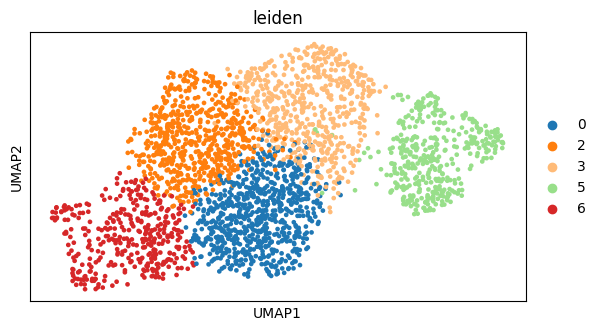

In [6]:
a = sc.pl.umap(adata_mer, color=['leiden'], show = False)
a.set_aspect('equal')
# a.invert_yaxis()

### manually run CCA

In [7]:

scaler_X = StandardScaler().fit(adata_mer.X)
X_mer_scaled = scaler_X.transform(adata_mer.X)

S_mer = processing.get_hemi(adata_mer.obsm['spatial'], mesh_LC)    
scaler_S = StandardScaler().fit(S_mer)
S_mer_scaled = scaler_S.transform(S_mer)
# S_mer_scaled = S_mer.copy()


In [8]:
n_components = 2
cca = CCA(n_components=n_components)
cca.fit(X_mer_scaled, S_mer_scaled)
X_c, S_c = cca.transform(X_mer_scaled, S_mer_scaled)
canonical_correlations = [np.corrcoef(X_c[:, i], S_c[:, i])[0, 1] for i in range(n_components)]
print("Canonical correlations:", canonical_correlations)

Canonical correlations: [np.float64(0.9269336291357589), np.float64(0.8906036820422798)]


In [9]:
cca.y_weights_

array([[-0.99686632, -0.05273333],
       [ 0.05737438, -0.99514184],
       [-0.05445847, -0.08313792]])

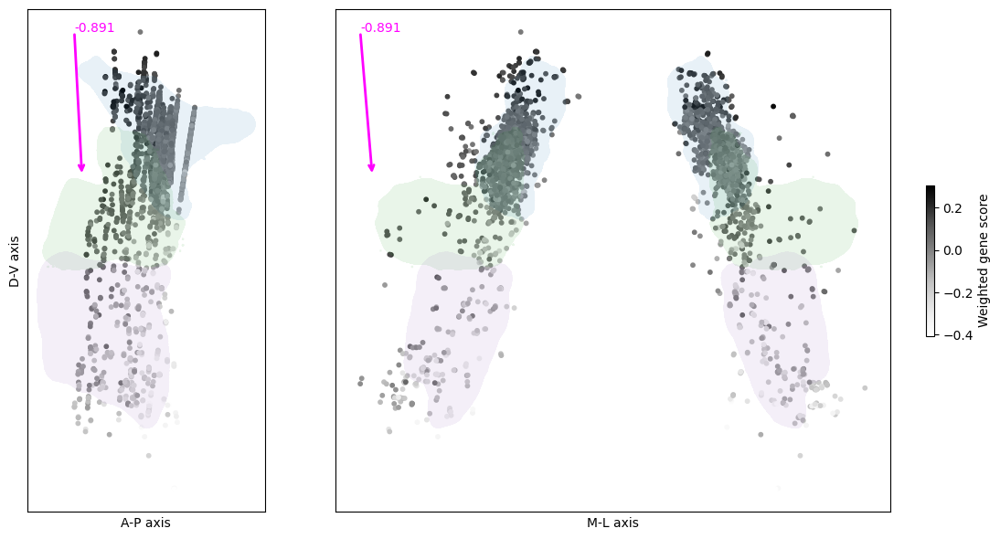

In [10]:
k = 1
scale_factor = 50 # Adjust this factor as needed
vector =(cca.y_weights_[:,k]) 
vector_scaled = vector * -scale_factor

fig, (ax1, ax2) = plt.subplots(
    1, 2,
    figsize=(12, 6),
    gridspec_kw={'width_ratios': [1, 2]}
)


ax1.scatter(adata_mer.obsm['spatial'][:, 0], adata_mer.obsm['spatial'][:, 1], c=X_c[:, k],cmap='Greys',s=10)
ax1.set_aspect('equal')

start_point_all = np.min(adata_mer.obsm['spatial'],0)
start_point = (start_point_all[0],start_point_all[1])
end_point = (start_point_all[0] + vector_scaled[0], start_point_all[1] + vector_scaled[1])

ax1.annotate('',
#     "%.3f" %-canonical_correlations[k],color='magenta',
             xy=end_point,   # arrow tip
             xytext=start_point,  # arrow tail
             arrowprops=dict(arrowstyle="->", color="magenta", lw=2))
ax1.text(start_point[0],start_point[1],np.around(-canonical_correlations[k],3).astype(str), color = 'magenta')


ax1.triplot(mesh_LC.vertices.T[0], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .1, label = 'LC')
ax1.triplot(mesh_CD.vertices.T[0], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .1, label = 'CD')
ax1.triplot(mesh_CV.vertices.T[0], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .1, label = 'CV')
ax1.invert_yaxis()
ax1.grid(False)
ax1.set_yticks([])
ax1.set_ylabel("D-V axis")
ax1.set_xticks([])
ax1.set_xlabel("A-P axis")


sca = ax2.scatter(
    adata_mer.obsm['spatial'][:, 2],
    adata_mer.obsm['spatial'][:, 1],
    c=X_c[:, k],
    cmap='Greys',
    s=10)
cbar = plt.colorbar(sca, ax=ax2, label='Weighted gene score', shrink=0.3)
ax2.set_aspect('equal')
start_point_all = np.min(adata_mer.obsm['spatial'],0)
start_point = (start_point_all[2],start_point_all[1])
end_point = (start_point_all[2] + vector_scaled[2], start_point_all[1] + vector_scaled[1])

ax2.triplot(mesh_LC.vertices.T[2], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .1, label = 'LC')
ax2.triplot(mesh_CD.vertices.T[2], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .1, label = 'CD')
ax2.triplot(mesh_CV.vertices.T[2], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .1, label = 'CV')

ax2.annotate('',
#     "%.3f" %-canonical_correlations[k],color='magenta',
             xy=end_point,   # arrow tip
             xytext=start_point,  # arrow tail
             arrowprops=dict(arrowstyle="->", color="magenta", lw=2))
ax2.text(start_point[0],start_point[1],np.around(-canonical_correlations[k],3).astype(str), color = 'magenta')

ax2.invert_yaxis()
ax2.grid(False)
ax2.set_yticks([])
ax2.set_xticks([])
ax2.set_xlabel("M-L axis")

fig.tight_layout()
# plt.gcf().set_dpi(200) 
plt.show()

## see CCA 2 score on CCF AND umap 
(new 05/07/2025)

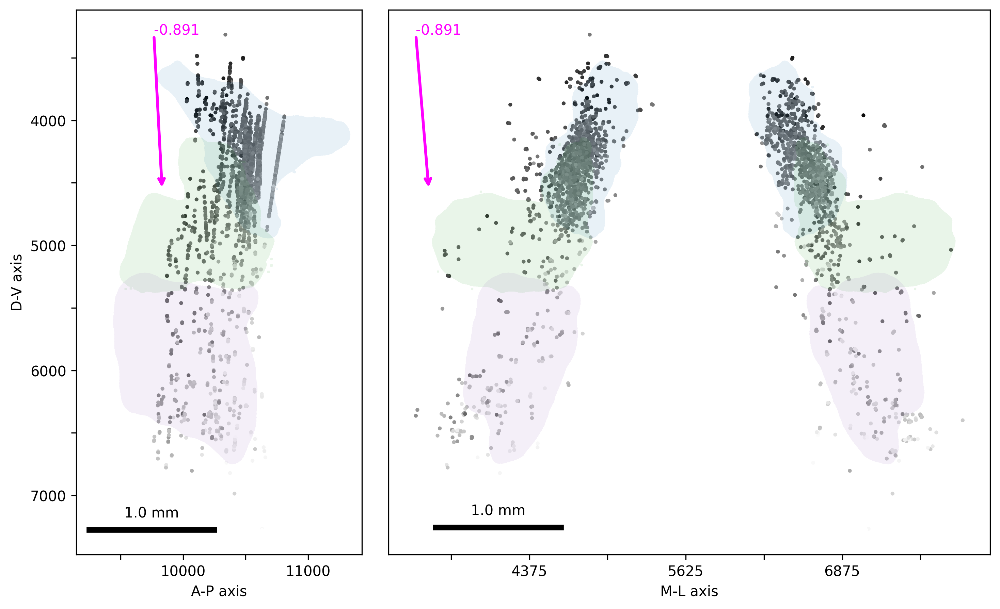

In [11]:
s = 3
k = 1
scale_factor = 50 # Adjust this factor as needed
vector =(cca.y_weights_[:,k]) 
vector_scaled = vector * -scale_factor

fig, (ax1, ax2) = plt.subplots(
    1, 2,
    figsize=(10, 6),
    gridspec_kw={'width_ratios': [1, 2]}
)


ax1.scatter(adata_mer.obsm['spatial'][:, 0], adata_mer.obsm['spatial'][:, 1],c=X_c[:, k], s=s, cmap = 'Greys')
ax1.set_aspect('equal')

start_point_all = np.min(adata_mer.obsm['spatial'],0)
start_point = (start_point_all[0],start_point_all[1])
end_point = (start_point_all[0] + vector_scaled[0], start_point_all[1] + vector_scaled[1])

ax1.annotate('',
#     "%.3f" %-canonical_correlations[k],color='magenta',
             xy=end_point,   # arrow tip
             xytext=start_point,  # arrow tail
             arrowprops=dict(arrowstyle="->", color="magenta", lw=2))
ax1.text(start_point[0],start_point[1],np.around(-canonical_correlations[k],3).astype(str), color = 'magenta')


ax1.triplot(mesh_LC.vertices.T[0], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .1, label = 'LC')
ax1.triplot(mesh_CD.vertices.T[0], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .1, label = 'CD')
ax1.triplot(mesh_CV.vertices.T[0], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .1, label = 'CV')
ax1.invert_yaxis()
ax1.grid(False)
ax1.set_ylabel("D-V axis")
ax1.set_xlabel("A-P axis")
xt = ax1.get_xticks(); yt = ax1.get_yticks()
ax1.set_xticks(xt); ax1.set_yticks(yt)
ax1.set_xticklabels(plotting.format_ticklabels(xt))
ax1.set_yticklabels(plotting.format_ticklabels(yt))
plotting.draw_scale_bar(ax1,length_px=40,linewidth=4)


sca = ax2.scatter(adata_mer.obsm['spatial'][:, 2], adata_mer.obsm['spatial'][:, 1],c=X_c[:, k], s=s, cmap = 'Greys')
# cbar = plt.colorbar(sca, ax=ax2, label='Weighted gene score', shrink=0.3)
ax2.set_aspect('equal')
start_point_all = np.min(adata_mer.obsm['spatial'],0)
start_point = (start_point_all[2],start_point_all[1])
end_point = (start_point_all[2] + vector_scaled[2], start_point_all[1] + vector_scaled[1])

ax2.triplot(mesh_LC.vertices.T[2], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .1, label = 'LC')
ax2.triplot(mesh_CD.vertices.T[2], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .1, label = 'CD')
ax2.triplot(mesh_CV.vertices.T[2], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .1, label = 'CV')

ax2.annotate('',
#     "%.3f" %-canonical_correlations[k],color='magenta',
             xy=end_point,   # arrow tip
             xytext=start_point,  # arrow tail
             arrowprops=dict(arrowstyle="->", color="magenta", lw=2))
ax2.text(start_point[0],start_point[1],np.around(-canonical_correlations[k],3).astype(str), color = 'magenta')

ax2.invert_yaxis()
ax2.grid(False)
ax2.set_yticks([]);

ax2.set_xlabel("M-L axis")
xt = ax2.get_xticks(); yt = ax2.get_yticks()
ax2.set_xticks(xt); ax2.set_yticks(yt)
ax2.set_xticklabels(plotting.format_ticklabels(xt))
ax2.set_yticklabels(plotting.format_ticklabels(yt))
plotting.draw_scale_bar(ax2,length_px=40,linewidth=4)
fig.tight_layout()
plt.gcf().set_dpi(300) 
plt.show()

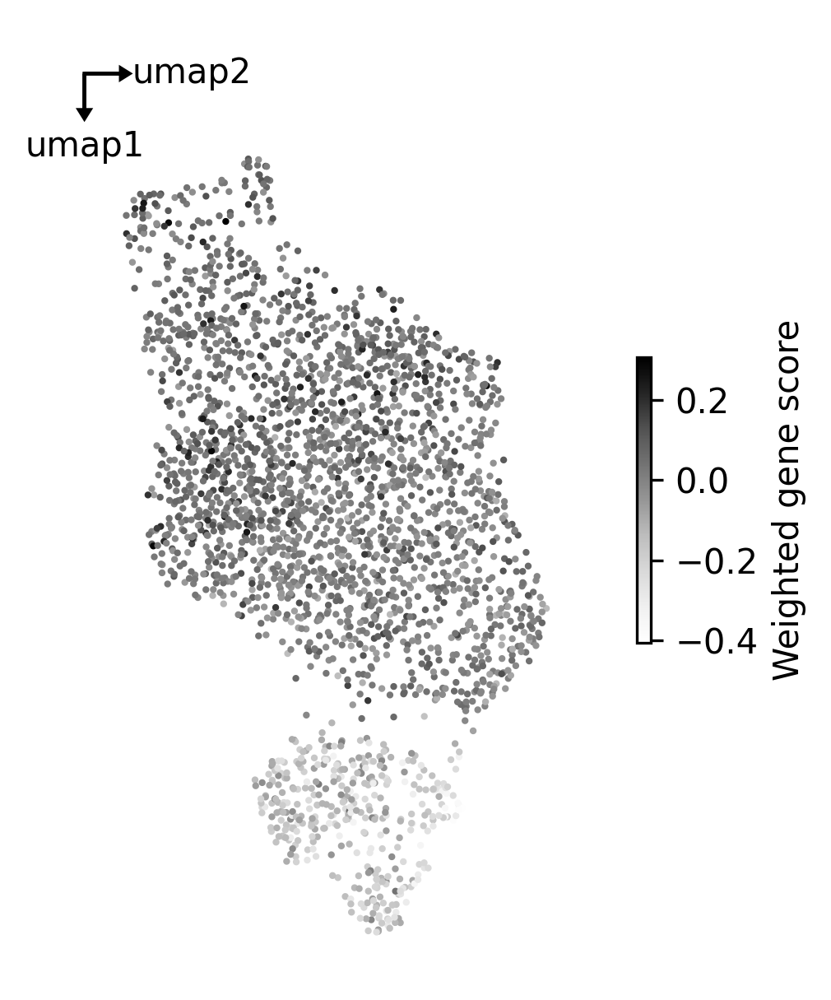

In [12]:
s = 1

fs = 10
plt.figure(figsize=(7,5))
ax = plt.gca()

sca = ax.scatter(adata_mer.obsm['X_umap'][:, 1], adata_mer.obsm['X_umap'][:, 0], c=X_c[:, k],cmap='Greys',s=s)
ax.set_aspect('equal')    
cbar = plt.colorbar(sca, ax=ax, label='Weighted gene score', shrink=0.3)

for spine in ax.spines.values():
    spine.set_visible(False)
ax.set_xticks([])
ax.set_yticks([])
ax.invert_yaxis()

y0,x0 = np.min(adata_mer.obsm['X_umap'], 0)
y0*=1.4
x0*=0.8
ax.arrow(x0, y0, 1, 0,
         head_width=0.25, head_length=0.2,
         length_includes_head=True, linewidth=1, color='k')
ax.arrow(x0, y0, 0, 1,
         head_width=0.25, head_length=0.2,
         length_includes_head=True, linewidth=1, color='black')

ax.text(x0+1.05, y0, 'umap2', va='center', ha='left', fontsize=fs)
ax.text(x0, y0+2, 'umap1', va='bottom', ha='center', fontsize=fs)
ax.set_aspect('equal')
plt.gcf().set_dpi(300) 
plt.show()


# imputations

In [31]:
allyourgenes = ['Epha6',
 'Lrrc7',
 'Aopep',
 'Alcam',
 'Cntnap5b',
 'Dab1',
 'Fat3',
 'B3galt1',
 'Gpc6',
 'Chsy3',
 'Pcdh9',
 'Ptprd',
 'Pcdh7',
 'Dcc',
 'Opcml']


allyourgenes = ['Epha6',
 'Lrrc7',
 'Aopep',
 'Alcam',
 'Cntnap5b',
 'Robo1',
 'Ncam2',
 'Pantr1',
 'Htr2c',
 'Dab1',
 'Fat3',
 'B3galt1',
 'Gpc6',
 'Chsy3',
 'Sez6',
 'Hs6st3',
 'Grip1',
 'Prickle2',
 'Pcdh9',
 'Npas3',
 'Sema6d',
 'Galntl6',
 'Ptprd',
 'Pcdh7',
 'Dcc',
 'Nlgn1',
 'Opcml']

[m in list(adata_mer.var_names) for m in allyourgenes]

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False]

### imputation parts 

In [32]:
import anndata


In [33]:
adata_mer.shape

(2651, 315)

In [34]:


adata_foo = sc.read_h5ad("/home/shuonan.chen/scratch_shuonan//LC_scRNAseq/conversion_files/snRNAseq_LCNE_BN_new.h5ad")

adata_sc = anndata.AnnData(adata_foo.layers['BN'])
adata_sc.obs = adata_foo.obs.copy()
adata_sc.obsm = adata_foo.obsm.copy()
adata_sc.var = adata_foo.var.copy()

In [35]:
adata_sc.shape

(4895, 5126)

In [36]:
var_names = adata_mer.var_names.intersection(adata_sc.var_names)
adata_mer_foo = adata_mer[:,var_names]  # 314 genes 
print(adata_mer_foo.X.max())# do not normalize again.

0.24816138


In [37]:
adata_mer_imputed = imputations.impute_mer_data(adata_sc, adata_mer_foo, k=200, n_hvg=None)

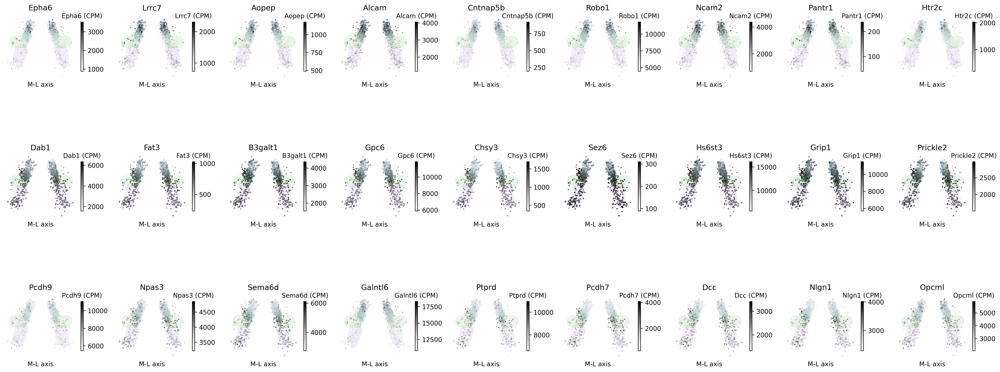

In [38]:
plt.figure(figsize = (22,10))
for k,gene in enumerate(allyourgenes):
    plt.subplot(3,int(len(allyourgenes)/3),k+1)
    sca = plt.scatter(adata_mer_imputed.obsm['spatial'][:,2],adata_mer_imputed.obsm['spatial'][:,1], 
                     cmap ='Greys', c=1e6*adata_mer_imputed[:,gene].X.toarray(), s = 1)    
    plotting.plot_mesh(plt.gca(),allmeshes)
    plt.title(gene)
    cbar = plt.colorbar(sca, ax=plt.gca(),  shrink=0.3)
    cbar.ax.xaxis.set_label_position('top')
    cbar.ax.set_xlabel(f"{gene} (CPM)", ha='center', va='bottom')
    plotting.plot_mesh(ax, allmeshes,direction = 'c')
    plt.xlabel("M-L axis") 
       
    plt.gca().set_xticks([]);plt.gca().set_yticks([]);
    for spine in plt.gca().spines.values():
        spine.set_visible(False)
plt.tight_layout()
plt.gcf().set_dpi(300)
plt.show()    


In [39]:
adata_mer_imputed.var_names

Index(['0610040F04Rik', '0610040J01Rik', '0610043K17Rik', '1010001N08Rik',
       '1110002J07Rik', '1110015O18Rik', '1110019D14Rik', '1110046J04Rik',
       '1500009L16Rik', '1500012K07Rik',
       ...
       'mt-Co2', 'mt-Co3', 'mt-Cytb', 'mt-Nd1', 'mt-Nd2', 'mt-Nd3', 'mt-Nd4',
       'mt-Nd4l', 'mt-Nd5', 'mt-Nd6'],
      dtype='object', length=5126)

# make a heatmap 

In [40]:
import heatmap
import seaborn as sns

In [41]:
k = 1
direction_of_interest = -(cca.y_weights_[:,k]) 
S_mer = processing.get_hemi(adata_mer.obsm['spatial'], mesh_LC)    
direction_norm = direction_of_interest / np.linalg.norm(direction_of_interest)
projected = S_mer @ direction_norm



In [42]:
adata_mer_imputed

AnnData object with n_obs × n_vars = 2651 × 5126
    obs: 'slicename', 'x_CCF', 'y_CCF', 'z_CCF', 'mouse_name', 'mouse_sex', '_scvi_batch', '_scvi_labels', 'leiden', 'sex', 'impute_quality', 'not_confident', 'confidence_vals'
    uns: 'holdoff_genes'
    obsm: 'spatial'

In [43]:
inputheatmap = adata_mer_imputed[:,allyourgenes].X.toarray()[np.argsort(projected)].T
ordered_data, row_order_mer = heatmap.get_final_heatmap(inputheatmap)

In [46]:
# in fact we want to use the same row_order as in snRNAseq

row_order_GT = [15,
 16,
 17,
 14,
 11,
 12,
 9,
 10,
 13,
 20,
 23,
 25,
 24,
 22,
 18,
 26,
 19,
 4,
 8,
 5,
 0,
 21,
 2,
 7,
 1,
 6,
 3]

In [53]:
T

9

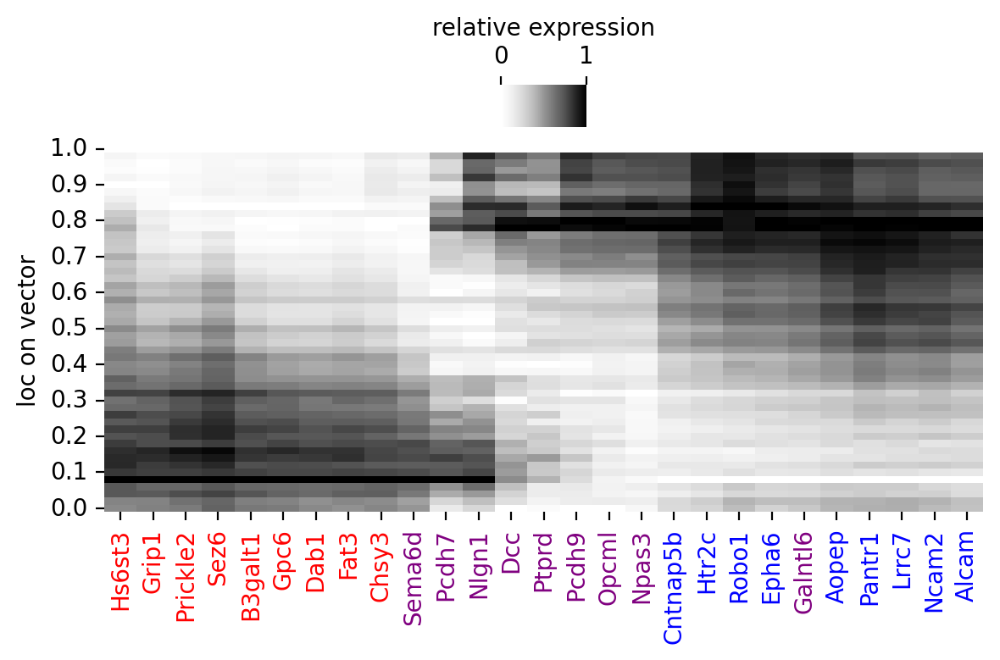

In [54]:
T = int(len(row_order_GT)/3)
tick_colors = []
for orig_idx in row_order_GT:
    if orig_idx < T:
        tick_colors.append('blue')
    elif orig_idx < 2*T:
        tick_colors.append('red')
    else:
        tick_colors.append('purple')


plt.figure(figsize=(6, 4))
sns.heatmap(
    ordered_data.T,
    cmap='Greys',
    cbar_kws={'location': 'top','label': 'relative expression',
        'shrink': 0.3,'aspect': 2,'fraction': 0.1}
)

# Set xtick labels and colors
xtick_labels = [allyourgenes[l] for l in row_order_GT]
xticks = plt.gca().get_xticks()

plt.xticks(ticks=xticks, labels=xtick_labels, rotation=90)
for tick, color in zip(plt.gca().get_xticklabels(), tick_colors):
    tick.set_color(color)

plt.ylabel('loc on vector')
plt.gca().invert_yaxis()
plt.yticks(np.arange(11)*(ordered_data.shape[1]//10)+0.5, np.around(np.linspace(0, 1, 11), 1), rotation=0)
plt.grid(False)
plt.tight_layout()
plt.gcf().set_dpi(200)
plt.show()

In [51]:
selected_genes= ['Epha6','Pcdh9','Dab1',]
foocol = ['blue','purple','red']

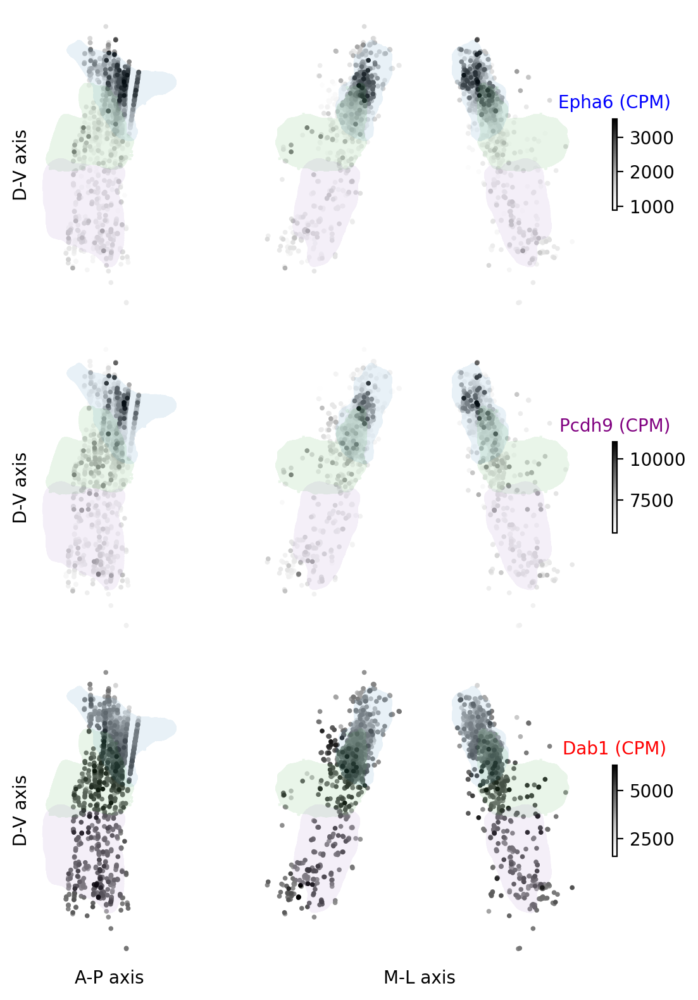

In [52]:
s = 3
fig, axes = plt.subplots(3,2,figsize=(6,8),
    gridspec_kw={'width_ratios': [1, 2]})

for k in range(3):
    ax = axes[k,0]
    plotorder = np.argsort(adata_mer_imputed[:,selected_genes[k]].X.flatten())
    sca = ax.scatter(adata_mer.obsm['spatial'][plotorder,0],adata_mer.obsm['spatial'][plotorder,1],
                      cmap ='Greys',
                      s =s,
                      c = 1e6*adata_mer_imputed[plotorder,selected_genes[k]].X.toarray())    
    plotting.plot_mesh(ax, allmeshes,direction = 's')
    ax.set_ylabel("D-V axis");
    ax.set_xlabel("A-P axis") if k==2 else ax.set_xlabel('');
    ax.set_xticks([]);ax.set_yticks([]);
    for spine in ax.spines.values():
        spine.set_visible(False)
    
    ax = axes[k,1]
    sca = ax.scatter(adata_mer.obsm['spatial'][plotorder,2],adata_mer.obsm['spatial'][plotorder,1],
                      cmap ='Greys',
                      s =s,
                      c = 1e6*adata_mer_imputed[plotorder,selected_genes[k]].X.toarray())    
    cbar = plt.colorbar(sca, ax=ax,  shrink=0.3)
    cbar.ax.xaxis.set_label_position('top')
    cbar.ax.set_xlabel(f"{selected_genes[k]} (CPM)", ha='center', va='bottom', color = foocol[k])
    plotting.plot_mesh(ax, allmeshes,direction = 'c')
    ax.set_xlabel("M-L axis") if k==2 else ax.set_xlabel('');
       
    ax.set_xticks([]);ax.set_yticks([]);
    for spine in ax.spines.values():
        spine.set_visible(False)
fig.tight_layout()
fig.set_dpi(200)  # set dpi for the entire figure
    
    


# the code below are not used 


### bin to 3 category, 

In [49]:
k = 1
direction_of_interest = -(cca.y_weights_[:,k]) 
direction_norm = direction_of_interest / np.linalg.norm(direction_of_interest)
projected = S_mer @ direction_norm
# projected = adata_mer.obsm['spatial'][:,1]

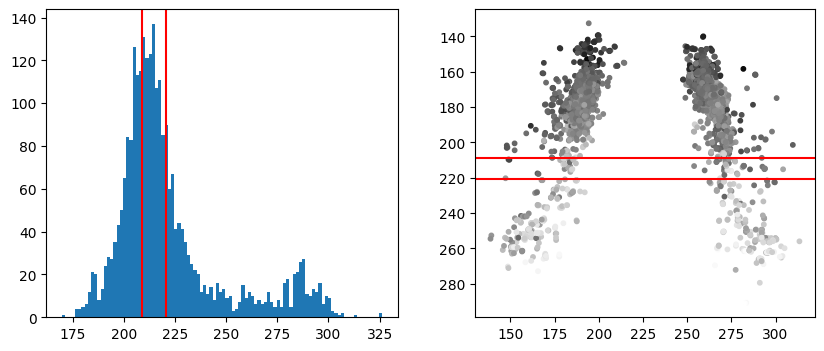

In [50]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
plt.hist(projected, bins = 100);
for m in np.quantile(projected, (0.33,0.66)):
    plt.axvline(m, color = 'red')
    
plt.subplot(1,2,2)    
plt.scatter(
    adata_mer.obsm['spatial'][:, 2],
    adata_mer.obsm['spatial'][:, 1],
    c=X_c[:, k],
    cmap='Greys',
    s=10)
for m in np.quantile(projected, (0.33,0.66)):
    plt.axhline(m,color='red')
plt.gca().invert_yaxis()
plt.gca().set_aspect('equal')    

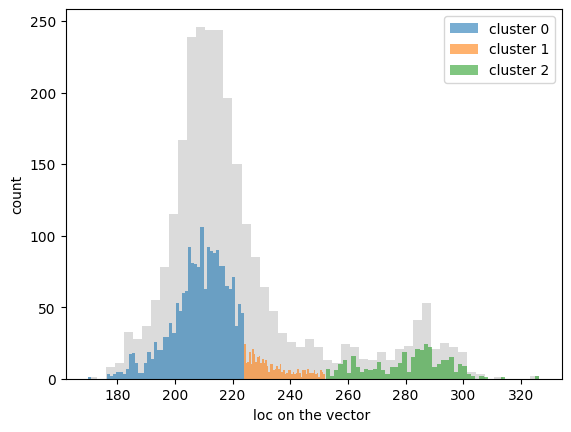

In [51]:
from sklearn.mixture import GaussianMixture
X = projected.reshape(-1, 1)
gmm = GaussianMixture(n_components=3, random_state=9)
gmm.fit(X)
labels = gmm.predict(X)
order = np.argsort(gmm.means_.flatten())
mapped = np.zeros_like(labels)
for i, comp in enumerate(order):
    mapped[labels == comp] = i
labels = mapped  # now labels ∈ {0,1,2} in ascending order of mean


plt.hist(projected, bins=50, color='lightgray', alpha=0.8)
for c in range(3):
    plt.hist(projected[labels == c], bins=50, alpha=0.6, label=f'cluster {c}')
plt.legend()
plt.xlabel('loc on the vector ')
plt.ylabel('count')
plt.show()

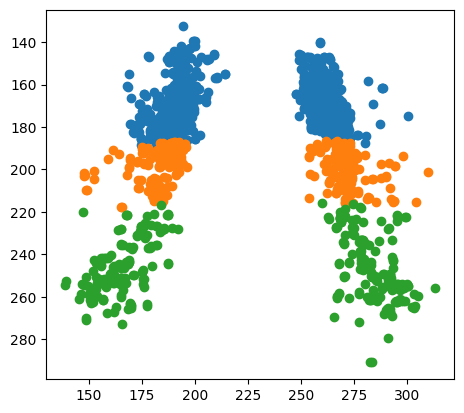

In [52]:
for l in np.unique(labels):
    plt.scatter(
        adata_mer.obsm['spatial'][labels==l, 2],
        adata_mer.obsm['spatial'][labels==l, 1])
plt.gca().invert_yaxis()
plt.gca().set_aspect('equal')    

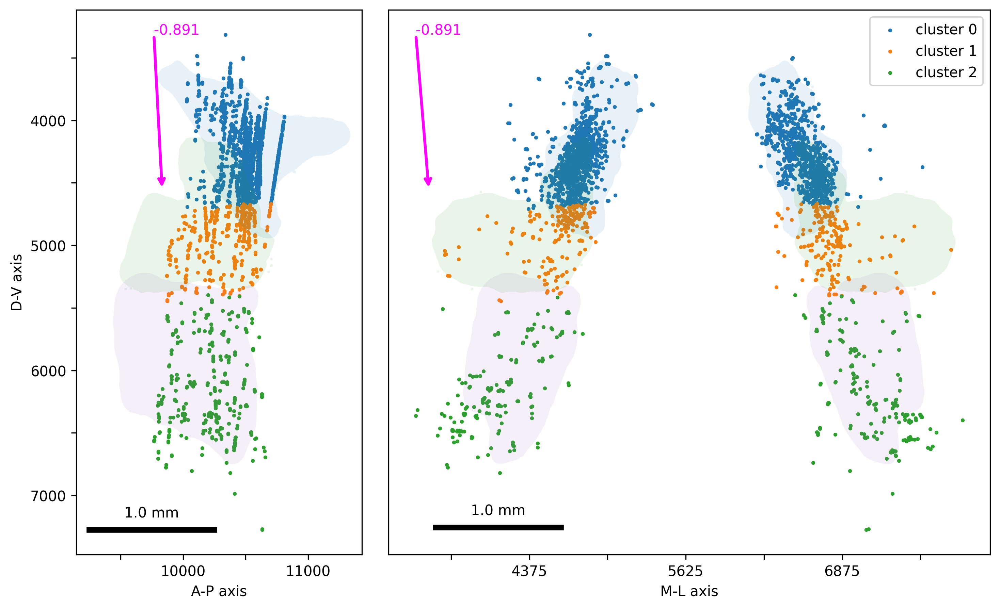

In [56]:
s = 3
k = 1
scale_factor = 50 # Adjust this factor as needed
vector =(cca.y_weights_[:,k]) 
vector_scaled = vector * -scale_factor

fig, (ax1, ax2) = plt.subplots(
    1, 2,
    figsize=(10, 6),
    gridspec_kw={'width_ratios': [1, 2]}
)

for l in np.unique(labels):
    ax1.scatter(adata_mer.obsm['spatial'][labels==l, 0], 
                adata_mer.obsm['spatial'][labels==l, 1], s=s)
ax1.set_aspect('equal')

start_point_all = np.min(adata_mer.obsm['spatial'],0)
start_point = (start_point_all[0],start_point_all[1])
end_point = (start_point_all[0] + vector_scaled[0], start_point_all[1] + vector_scaled[1])

ax1.annotate('',
#     "%.3f" %-canonical_correlations[k],color='magenta',
             xy=end_point,   # arrow tip
             xytext=start_point,  # arrow tail
             arrowprops=dict(arrowstyle="->", color="magenta", lw=2))
ax1.text(start_point[0],start_point[1],np.around(-canonical_correlations[k],3).astype(str), color = 'magenta')


ax1.triplot(mesh_LC.vertices.T[0], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .1, label = 'LC')
ax1.triplot(mesh_CD.vertices.T[0], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .1, label = 'CD')
ax1.triplot(mesh_CV.vertices.T[0], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .1, label = 'CV')
ax1.invert_yaxis()
ax1.grid(False)
# ax1.set_yticks([])
ax1.set_ylabel("D-V axis")
# ax1.set_xticks([])
ax1.set_xlabel("A-P axis")
xt = ax1.get_xticks(); yt = ax1.get_yticks()
ax1.set_xticks(xt); ax1.set_yticks(yt)
ax1.set_xticklabels(plotting.format_ticklabels(xt))
ax1.set_yticklabels(plotting.format_ticklabels(yt))
plotting.draw_scale_bar(ax1,length_px=40,linewidth=4)


for l in np.unique(labels):
    sca = ax2.scatter(adata_mer.obsm['spatial'][labels==l, 2], 
                adata_mer.obsm['spatial'][labels==l, 1],label=f'cluster {l}',s=s)
ax2.legend()    
# cbar = plt.colorbar(sca, ax=ax2, label='Weighted gene score', shrink=0.3)
ax2.set_aspect('equal')
start_point_all = np.min(adata_mer.obsm['spatial'],0)
start_point = (start_point_all[2],start_point_all[1])
end_point = (start_point_all[2] + vector_scaled[2], start_point_all[1] + vector_scaled[1])

ax2.triplot(mesh_LC.vertices.T[2], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .1, label = 'LC')
ax2.triplot(mesh_CD.vertices.T[2], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .1, label = 'CD')
ax2.triplot(mesh_CV.vertices.T[2], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .1, label = 'CV')

ax2.annotate('',
#     "%.3f" %-canonical_correlations[k],color='magenta',
             xy=end_point,   # arrow tip
             xytext=start_point,  # arrow tail
             arrowprops=dict(arrowstyle="->", color="magenta", lw=2))
ax2.text(start_point[0],start_point[1],np.around(-canonical_correlations[k],3).astype(str), color = 'magenta')

ax2.invert_yaxis()
ax2.grid(False)
ax2.set_yticks([]);
# ax2.set_xticks([])
ax2.set_xlabel("M-L axis")
xt = ax2.get_xticks(); yt = ax2.get_yticks()
ax2.set_xticks(xt); ax2.set_yticks(yt)
ax2.set_xticklabels(plotting.format_ticklabels(xt))
ax2.set_yticklabels(plotting.format_ticklabels(yt))
plotting.draw_scale_bar(ax2,length_px=40,linewidth=4)
fig.tight_layout()
plt.gcf().set_dpi(300) 
plt.show()

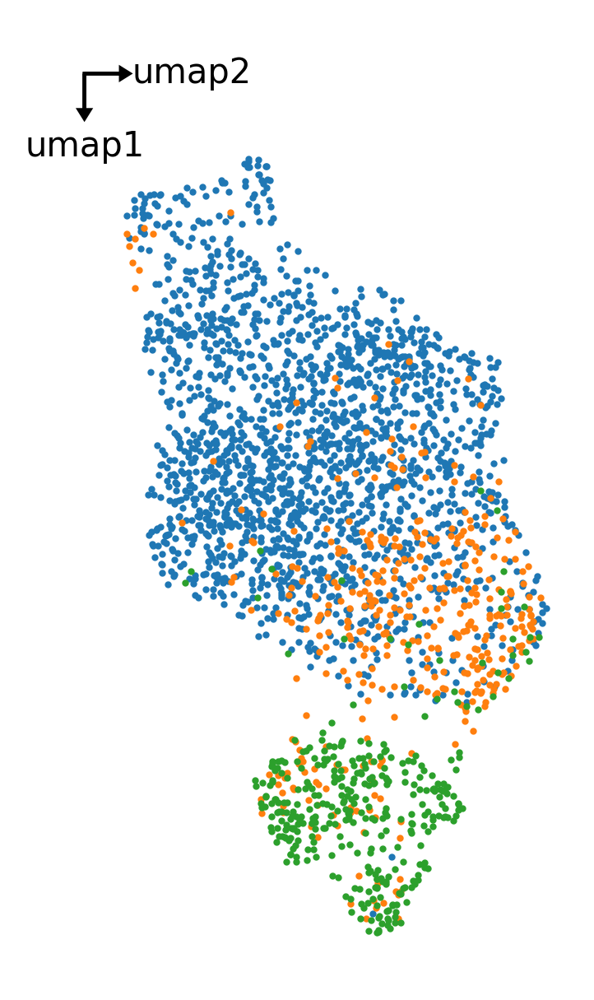

In [19]:
s = 1

fs = 10
plt.figure(figsize=(7,5))
ax = plt.gca()

for l in np.unique(labels):
    ax.scatter(adata_mer.obsm['X_umap'][labels==l,1],adata_mer.obsm['X_umap'][labels==l,0],
               label=f'cluster {l}',s=s)
# ax.legend()
ax.set_aspect('equal')    


for spine in ax.spines.values():
    spine.set_visible(False)
ax.set_xticks([])
ax.set_yticks([])
ax.invert_yaxis()

y0,x0 = np.min(adata_mer.obsm['X_umap'], 0)
y0*=1.4
x0*=0.8
ax.arrow(x0, y0, 1, 0,
         head_width=0.25, head_length=0.2,
         length_includes_head=True, linewidth=1, color='k')
ax.arrow(x0, y0, 0, 1,
         head_width=0.25, head_length=0.2,
         length_includes_head=True, linewidth=1, color='black')

ax.text(x0+1.05, y0, 'umap2', va='center', ha='left', fontsize=fs)
ax.text(x0, y0+2, 'umap1', va='bottom', ha='center', fontsize=fs)
ax.set_aspect('equal')
plt.gcf().set_dpi(300) 
plt.show()

# DE genes

In [20]:
adata_mer.obs['cluster_on_DV'] = [f'cluster {l}' for l in labels]
adata_mer.obs['cluster_on_DV']  = adata_mer.obs['cluster_on_DV'].astype('category')


/allen/aind/scratch/shuonan.chen/conda_envs/torch_on_gpu_py310/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 315 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


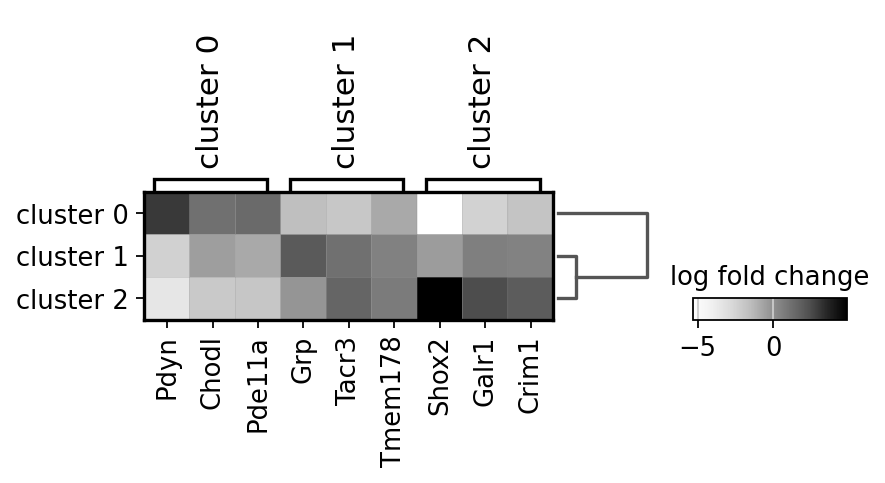

In [22]:
T = 5
sc.tl.rank_genes_groups(adata_mer, groupby='cluster_on_DV', method='wilcoxon')
sc.settings.set_figure_params(dpi=80, figsize=(2, 2))
sc.pl.rank_genes_groups_matrixplot(adata_mer, 
                                   n_genes=3, cmap ='Greys',
                                   key="rank_genes_groups",
                                   groupby="cluster_on_DV", 
                                   values_to_plot="logfoldchanges")

<Figure size 560x400 with 0 Axes>

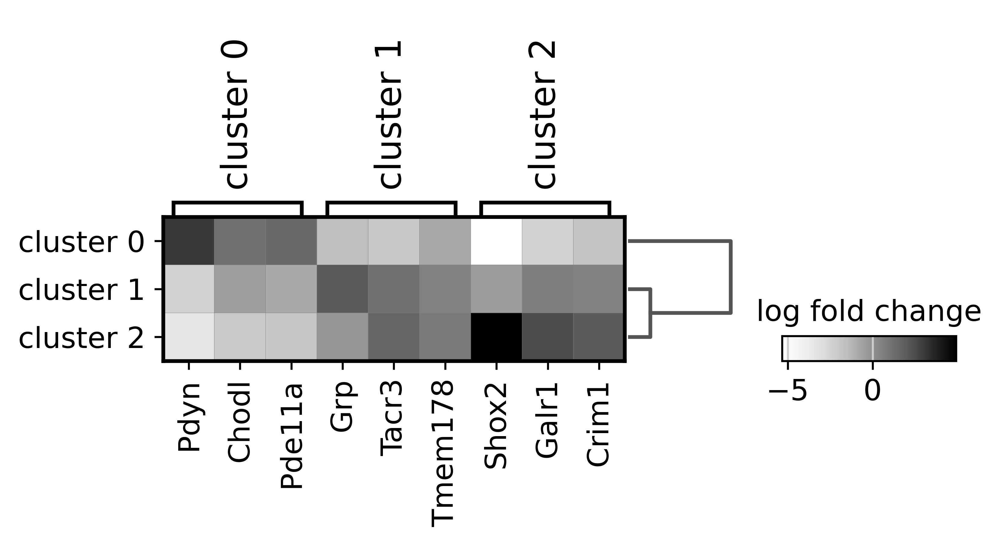

In [23]:
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42


plt.figure(figsize=(7,5))
ax = sc.pl.rank_genes_groups_matrixplot(
    adata_mer,
    n_genes=3,
    cmap='Greys',
    key='rank_genes_groups',
    groupby='cluster_on_DV',
    values_to_plot='logfoldchanges',
    show=False
)

# 2) set dpi & save
plt.gcf().set_dpi(300)
# plt.savefig('/home/shuonan.chen/scratch_shuonan/fig_making_LCNE/DE_merfish.pdf',
#             bbox_inches='tight')

plt.gcf().savefig('/home/shuonan.chen/scratch_shuonan/fig_making_LCNE/DE_merfish.eps', format='eps')


In [24]:
DEgenes = ['Shox2', 'Gad2', 'Ecel1','Ccdc88c', 'Ddc']
DEgenes = list(adata_mer.uns['rank_genes_groups']['names'][0])

In [25]:
DEgenes

['Pdyn', 'Grp', 'Shox2']

/scratch/fast/443156/ipykernel_1614965/1260357157.py:6: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


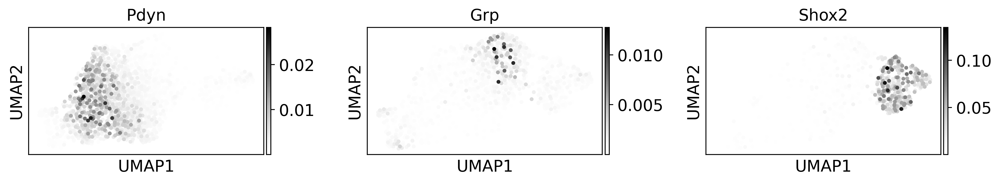

In [26]:
with plt.rc_context({"figure.figsize": (4,2)}):    
    ax = sc.pl.umap(adata_mer, cmap ='Greys',
                         color=DEgenes,ncols =5, show=False)    
    for a in ax:
        a.set_aspect('equal')
    plt.tight_layout()
plt.gcf().set_dpi(200)  # set dpi for the entire figure

    

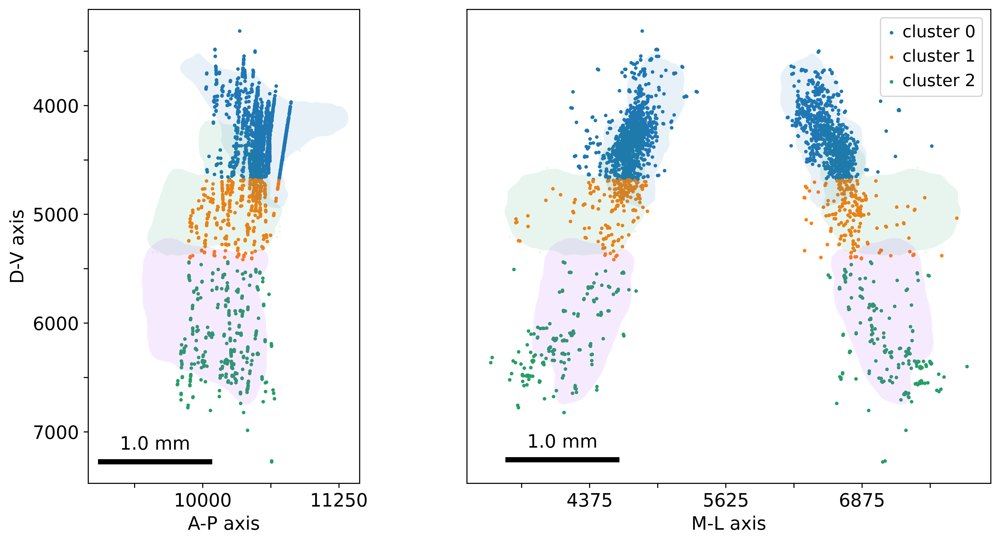

In [31]:
s = 3
k = 1
scale_factor = 50 # Adjust this factor as needed
vector =(cca.y_weights_[:,k]) 
vector_scaled = vector * -scale_factor

fig, (ax1, ax2) = plt.subplots(1, 2,
    figsize=(12, 6),gridspec_kw={'width_ratios': [1, 2]})

for l in np.unique(labels):
    ax1.scatter(adata_mer.obsm['spatial'][labels==l, 0], 
                adata_mer.obsm['spatial'][labels==l, 1], s=s)
ax1.set_aspect('equal')
plotting.plot_mesh(ax1, direction='s')
ax1.grid(False)
ax1.set_ylabel("D-V axis")

ax1.set_xlabel("A-P axis")
xt = ax1.get_xticks(); yt = ax1.get_yticks()
ax1.set_xticks(xt); ax1.set_yticks(yt)
ax1.set_xticklabels(format_ticklabels(xt))
ax1.set_yticklabels(format_ticklabels(yt))
draw_scale_bar(ax1,length_px=40,linewidth=4)


for l in np.unique(labels):
    sca = ax2.scatter(adata_mer.obsm['spatial'][labels==l, 2], 
                adata_mer.obsm['spatial'][labels==l, 1],label=f'cluster {l}',s=s)
ax2.legend()    
# cbar = plt.colorbar(sca, ax=ax2, label='Weighted gene score', shrink=0.3)
ax2.set_aspect('equal')
start_point_all = np.min(adata_mer.obsm['spatial'],0)
start_point = (start_point_all[2],start_point_all[1])
end_point = (start_point_all[2] + vector_scaled[2], start_point_all[1] + vector_scaled[1])
plotting.plot_mesh(ax2,direction='c')
ax2.grid(False)
ax2.set_yticks([]);
# ax2.set_xticks([])
ax2.set_xlabel("M-L axis")
xt = ax2.get_xticks(); yt = ax2.get_yticks()
ax2.set_xticks(xt); ax2.set_yticks(yt)
ax2.set_xticklabels(format_ticklabels(xt))
ax2.set_yticklabels(format_ticklabels(yt))
draw_scale_bar(ax2,length_px=40,linewidth=4)
fig.tight_layout()
plt.gcf().set_dpi(300) 
plt.show()

# heatmap

In [93]:
## first choose some DE genes
rg = adata_mer.uns['rank_genes_groups']
clusters = rg['names'].dtype.names   # e.g. ('0','1','2','3',...)
n_genes = 10

data = {}
genes = None
for cl in clusters:
    # rg['names'][cl] is an array of gene names sorted by significance
    top_names = rg['names'][cl][:n_genes]
    top_logfc  = rg['logfoldchanges'][cl][:n_genes]

{}

In [97]:

[rg['names'][cl][:n_genes] for cl in clusters]

[array(['Pdyn', 'Chodl', 'Pde11a', 'Dbh', 'Cd24a', 'Fbxl7', 'Slc6a2',
        'Kcnip4', 'Sntg2', 'Calcr'], dtype=object),
 array(['Grp', 'Tacr3', 'Tmem178', 'Ecel1', 'Nefm', 'Necab2', 'Nefh',
        'Grik1', 'Gabrg1', 'Cpne4'], dtype=object),
 array(['Shox2', 'Galr1', 'Crim1', 'Irs4', 'Necab2', 'Esr1', 'Nrn1',
        'Tacr3', 'Cbln1', 'Gabra4'], dtype=object)]

In [100]:
allyourgenes = []
for cl in clusters:
    allyourgenes = allyourgenes + list(rg['names'][cl][:n_genes])

        gene  spearman_corr        p_value
269    Tacr3       0.706325   0.000000e+00
197     Pdyn      -0.673065   0.000000e+00
275  Tmem178       0.640425  5.459796e-306
194   Pde11a      -0.617000  6.064231e-278
44     Chodl      -0.596971  8.883209e-256
86      Esr1       0.582197  2.102524e-240
163     Nefm       0.552459  9.601464e-212
160   Necab2       0.533483  6.450786e-195
198    Pdzd2       0.524312  3.674497e-187
101    Galr1       0.502687  8.651389e-170
237    Shox2       0.482726  7.930779e-155
296  Zfp804b       0.474656  4.697017e-149
203     Pon2      -0.462281  1.693154e-140
31     Calcr      -0.455209  9.174130e-136
161     Nefh       0.453187  1.974897e-134
75       Dbh      -0.438677  3.999874e-125
136   Kcnip4      -0.434334  1.999920e-122
97    Gabrg1       0.426520  1.143299e-117
204     Pon3      -0.423951  3.934357e-116
70     Crim1       0.422610  2.465467e-115


/scratch/fast/443156/ipykernel_1614965/546697066.py:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


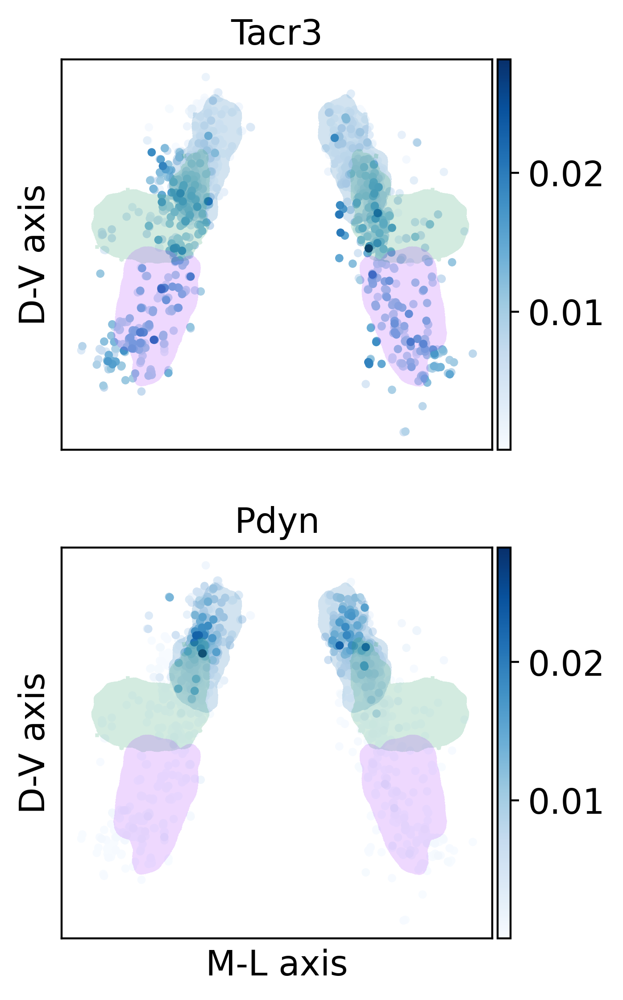

In [113]:
import pandas as pd
from scipy.stats import spearmanr, pearsonr

k=1
direction_of_interest = -(cca.y_weights_[:,k]) 
S_mer = get_hemi(adata_mer.obsm['spatial'], mesh_LC)    
direction_norm = direction_of_interest / np.linalg.norm(direction_of_interest)
projected = S_mer @ direction_norm
if hasattr(adata_mer.X, 'toarray'):
    X = adata_mer.X.toarray()
else:
    X = np.array(adata_mer.X)
gene_names = adata_mer.var_names
results = []
for i, gene in enumerate(gene_names):
    expr = X[:, i]
    corr, pval = spearmanr(expr, projected)
    results.append((gene, corr, pval))

df_results = pd.DataFrame(results, columns=['gene', 'spearman_corr', 'p_value'])
df_results_sorted = df_results.sort_values(by='spearman_corr', key=lambda s: s.abs(), ascending=False)

newly_found = list(df_results_sorted['gene'])
print(df_results_sorted.head(20))


T = 2
with plt.rc_context({"figure.figsize": (3,3)}):    
    ax = sc.pl.embedding(adata_mer, dimensions = (2, 1),basis="spatial", cmap ='Blues',
                         color=newly_found[:T], ncols =1, show=False)    
    for a in ax:
        a.triplot(mesh_LC.vertices.T[2], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .2, label = 'LC')
        a.triplot(mesh_CD.vertices.T[2], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .2, label = 'CD')
        a.triplot(mesh_CV.vertices.T[2], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .2, label = 'CV')
        a.invert_yaxis()
        a.set_aspect('equal')
        a.set_ylabel('D-V axis')
        a.set_xlabel('M-L axis') if a == ax[-1] else a.set_xlabel('')
            
        
plt.tight_layout()
plt.gcf().set_dpi(200) 

In [121]:
T =20

allyourgenes = newly_found[:T]
t_order = np.argsort(projected)
t_sorted = projected[t_order]

changing_heatmap = adata_mer[:,allyourgenes].X.copy()[t_order]
# minval = np.min(changing_heatmap,0)
# changing_heatmap -= minval
# changing_heatmap /= np.max(changing_heatmap, 0)
changing_heatmap = changing_heatmap.T

In [124]:
changing_heatmap.shape

(20, 2651)

In [ ]:
quantile_range = np.array((0.01, 0.99))
binnum = 21
new_positions = np.linspace(np.quantile(projected, quantile_range[0]), 
                            np.quantile(projected, quantile_range[1]), binnum)
changing_heatmap_sorted_interp = np.zeros((changing_heatmap.shape[0], binnum))

bin_width = new_positions[1] - new_positions[0]
half_width = bin_width / 2

for i, pos in enumerate(new_positions):
    left_idx = np.searchsorted(t_sorted, pos - half_width, side='left')
    right_idx = np.searchsorted(t_sorted, pos + half_width, side='right')
    
    if right_idx > left_idx:
        changing_heatmap_sorted_interp[:, i] = np.mean(changing_heatmap[:, left_idx:right_idx], axis=1)
    else:
        nearest_idx = np.searchsorted(t_sorted, pos, side='left')
        if nearest_idx == len(t_sorted):
            nearest_idx = len(t_sorted) - 1
        changing_heatmap_sorted_interp[:, i] = changing_heatmap[:, nearest_idx]
        
        
minval = np.min(changing_heatmap_sorted_interp,1)
changing_heatmap_sorted_interp -= minval[:,None]
changing_heatmap_sorted_interp /= np.max(changing_heatmap_sorted_interp, 1)[:,None]
        
Z = linkage(changing_heatmap_sorted_interp, method='ward', metric='euclidean', optimal_ordering=True)
dendro = dendrogram(Z, no_plot=True)
row_order = dendro['leaves']

ordered_data = changing_heatmap_sorted_interp[row_order]

plt.figure(figsize=(7,5))
sns.heatmap(ordered_data.T, cmap='Greys',cbar_kws={"shrink": 0.3},)
plt.xticks(np.arange(len(row_order)) + 0.5, [allyourgenes[l] for l in row_order], rotation=90)
plt.ylabel('CCA vector loc')
plt.yticks([]);
plt.grid(False)
# plt.title("rolling window average");
ax = plt.gca()
dv_coord_D = np.outer(np.quantile(projected, quantile_range[0]), direction_norm)[0,1]
dv_coord_D = dv_coord_D*25/1000
dv_coord_V = np.outer(np.quantile(projected, quantile_range[1]), direction_norm)[0,1]
dv_coord_V = dv_coord_V*25/1000
ax.text(-0.12, 1, f'Dorsal',#\n{np.around(dv_coord_D,3)} mm', 
        transform=ax.transAxes,
        ha='left', va='center', fontsize=12)
ax.text(-0, 0, f'Ventral',#\n{np.around(dv_coord_V,3)} mm', 
        transform=ax.transAxes,
        ha='right', va='center', fontsize=12)

plt.show()


In [103]:
t_order = np.argsort(projected)
t_sorted = projected[t_order]
changing_heatmap = adata_mer[:,allyourgenes].X.copy()[t_order]
changing_heatmap = changing_heatmap.T

In [105]:
from scipy.cluster.hierarchy import linkage, dendrogram
import seaborn as sns


# rolling window method
1. wiht all DV locations  
2. with only dorsal part

In [107]:
changing_heatmap_sorted_interp.shape

(30, 21)

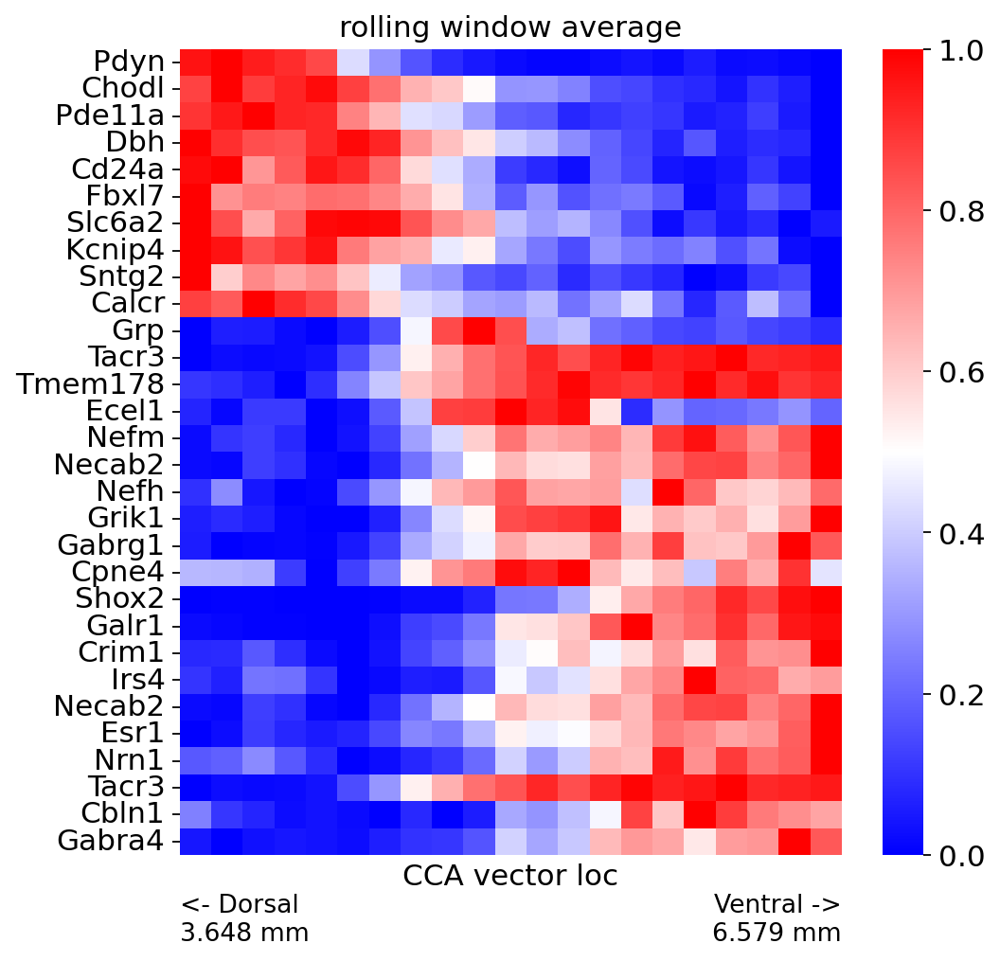

In [110]:
quantile_range = np.array((0.01, 0.99))
binnum = 21
new_positions = np.linspace(np.quantile(projected, quantile_range[0]), np.quantile(projected, quantile_range[1]), binnum)
changing_heatmap_sorted_interp = np.zeros((changing_heatmap.shape[0], binnum))

bin_width = new_positions[1] - new_positions[0]
half_width = bin_width / 2

for i, pos in enumerate(new_positions):
    left_idx = np.searchsorted(t_sorted, pos - half_width, side='left')
    right_idx = np.searchsorted(t_sorted, pos + half_width, side='right')
    
    if right_idx > left_idx:
        changing_heatmap_sorted_interp[:, i] = np.mean(changing_heatmap[:, left_idx:right_idx], axis=1)
    else:
        nearest_idx = np.searchsorted(t_sorted, pos, side='left')
        if nearest_idx == len(t_sorted):
            nearest_idx = len(t_sorted) - 1
        changing_heatmap_sorted_interp[:, i] = changing_heatmap[:, nearest_idx]
        
minval = np.min(changing_heatmap_sorted_interp,1)
changing_heatmap_sorted_interp -= minval[:,None]
changing_heatmap_sorted_interp /= np.max(changing_heatmap_sorted_interp, 1)[:,None]
ordered_data = changing_heatmap_sorted_interp

plt.figure(figsize=(7,7))
sns.heatmap(ordered_data, cmap='bwr')
plt.yticks(np.arange(len(allyourgenes)) + 0.5, allyourgenes, rotation=0)
plt.xlabel('CCA vector loc')
plt.xticks([]);
plt.grid(False)
plt.title("rolling window average");
ax = plt.gca()


dv_coord_D = np.outer(np.quantile(projected, quantile_range[0]), direction_norm)[0,1]
dv_coord_D = dv_coord_D*25/1000
dv_coord_V = np.outer(np.quantile(projected, quantile_range[1]), direction_norm)[0,1]
dv_coord_V = dv_coord_V*25/1000
ax.text(0, -0.08, f'<- Dorsal\n{np.around(dv_coord_D,3)} mm', transform=ax.transAxes,
        ha='left', va='center', fontsize=12)
ax.text(1, -0.08, f'Ventral ->\n{np.around(dv_coord_V,3)} mm', transform=ax.transAxes,
        ha='right', va='center', fontsize=12)

plt.show()


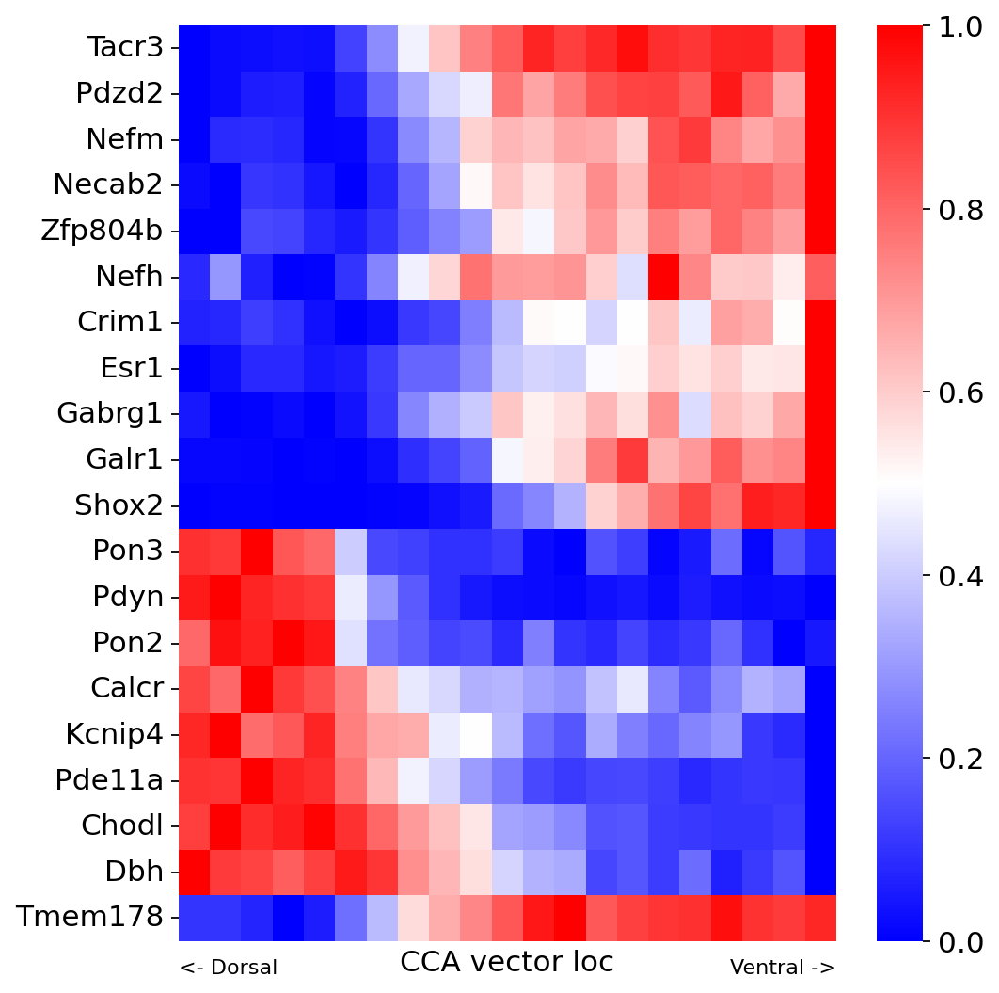

In [94]:

plt.figure(figsize=(7,8))
sns.heatmap(ordered_data, cmap='bwr')
plt.yticks(np.arange(len(row_order)) + 0.5, [allyourgenes[l] for l in row_order], rotation=0)
plt.xlabel('CCA vector loc');plt.xticks([]);
plt.grid(False)
ax = plt.gca()
dv_coord_D = np.outer(np.quantile(projected, quantile_range[0]), direction_norm)[0,1]
dv_coord_D = dv_coord_D*25/1000
dv_coord_V = np.outer(np.quantile(projected, quantile_range[1]), direction_norm)[0,1]
dv_coord_V = dv_coord_V*25/1000
ax.text(0, -0.03, f'<- Dorsal', transform=ax.transAxes,
        ha='left', va='center', fontsize=10)
ax.text(1, -0.03, f'Ventral ->', transform=ax.transAxes,
        ha='right', va='center', fontsize=10)

plt.show()


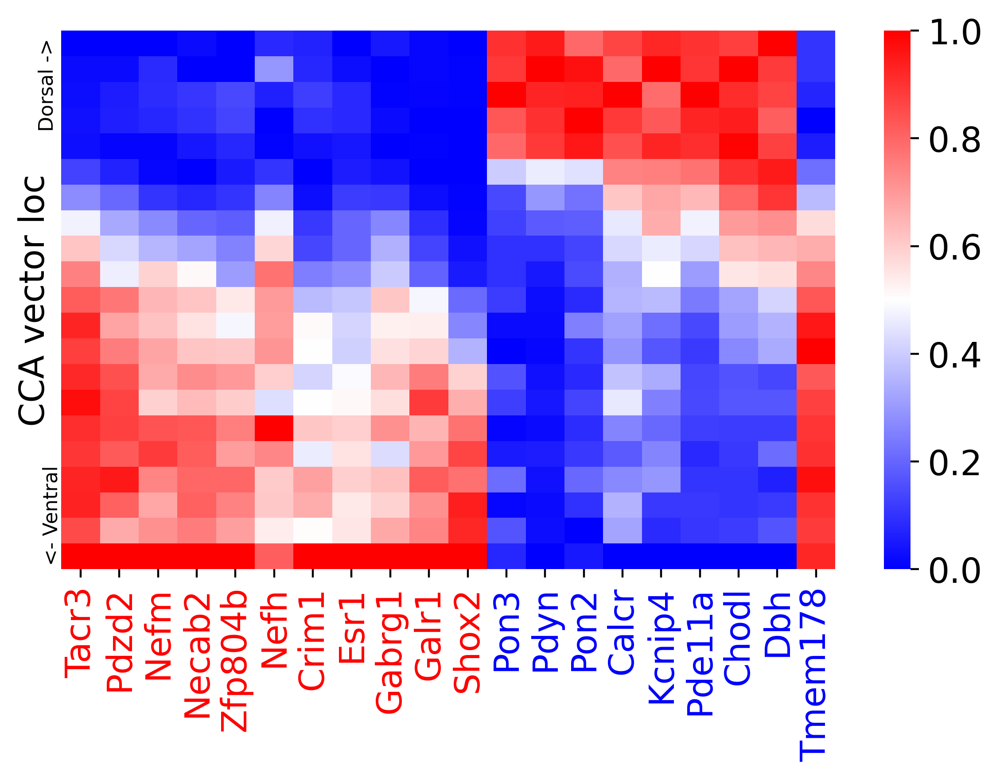

In [87]:
plt.figure(figsize=(7, 4))
sns.heatmap(ordered_data.T, cmap='bwr')
plt.xticks(np.arange(len(row_order)) + 0.5, [allyourgenes[l] for l in row_order], rotation=90)
plt.yticks([])
plt.ylabel('CCA vector loc')
plt.grid(False)
ax = plt.gca()
dv_coord_D = np.outer(np.quantile(projected, quantile_range[0]), direction_norm)[0, 1]
dv_coord_D = dv_coord_D * 25 / 1000
dv_coord_V = np.outer(np.quantile(projected, quantile_range[1]), direction_norm)[0, 1]
dv_coord_V = dv_coord_V * 25 / 1000
ax.text( -0.03, 0.9,f'Dorsal ->',#'\n{np.around(dv_coord_D, 3)} mm',
        rotation=90, transform=ax.transAxes, ha='left', va='center', fontsize=8)
ax.text(-0.0, 0.1, f'<- Ventral',#\n{np.around(dv_coord_V, 3)} mm',
        rotation=90, transform=ax.transAxes, ha='right', va='center', fontsize=8)

plt.gcf().set_dpi(200) 
plt.show()


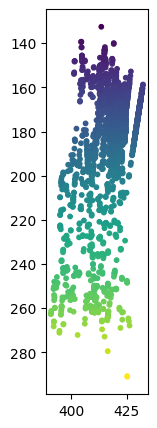

In [23]:
plt.figure(figsize= (5,5))
plt.scatter(adata_mer.obsm['spatial'][:, 0], adata_mer.obsm['spatial'][:, 1], c=projected,s=10)
plt.gca().invert_yaxis()
plt.gca().set_aspect('equal')

In [7]:
sc.tl.leiden(adata_mer, resolution = 0.2, key_added='coarse_clusters', random_state = 1)


/scratch/fast/215563/ipykernel_3304575/3127820183.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_mer, resolution = 0.2, key_added='coarse_clusters', random_state = 1)


In [8]:
import pandas as pd 
umap_coords = adata_mer.obsm['X_umap']
original_clusters = adata_mer.obs['coarse_clusters']
df = pd.DataFrame({
    'x': umap_coords[:, 0],
    'cluster': original_clusters.astype(str)  # ensure clusters are treated as strings
})
median_x = df.groupby('cluster')['x'].median()
ordered_clusters = median_x.sort_values().index.tolist()  # clusters sorted from leftmost to rightmost
mapping = {old_label: str(new_label) for new_label, old_label in enumerate(ordered_clusters)}
adata_mer.obs['coarse_clusters_ordered'] = adata_mer.obs['coarse_clusters'].map(mapping)

desired_order = ["0", "1", "2"]
adata_mer.obs['coarse_clusters_ordered'] = pd.Categorical(
    adata_mer.obs['coarse_clusters_ordered'],
    categories=desired_order,
    ordered=True
)



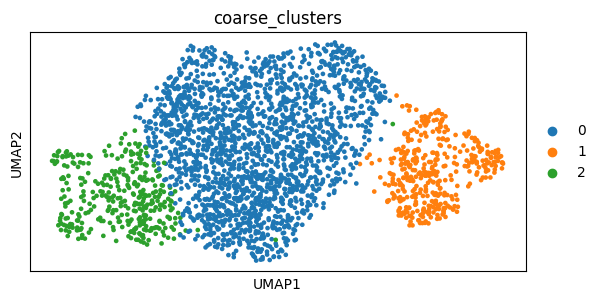

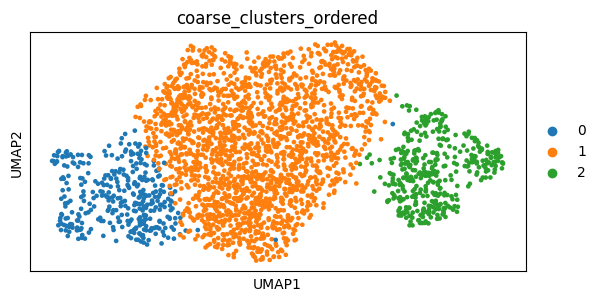

In [9]:
a = sc.pl.umap(adata_mer, color=['coarse_clusters'], show = False)
a.set_aspect('equal')
# a.invert_yaxis()

a = sc.pl.umap(adata_mer, color=['coarse_clusters_ordered'], show = False)
a.set_aspect('equal')
# a.invert_yaxis()


In [10]:
# adata_mer.obsm["X_umap"] = adata_mer.obsm["X_umap"][:, [1, 0]]
adata_mer.obsm["X_umap"][:,0] *= -1

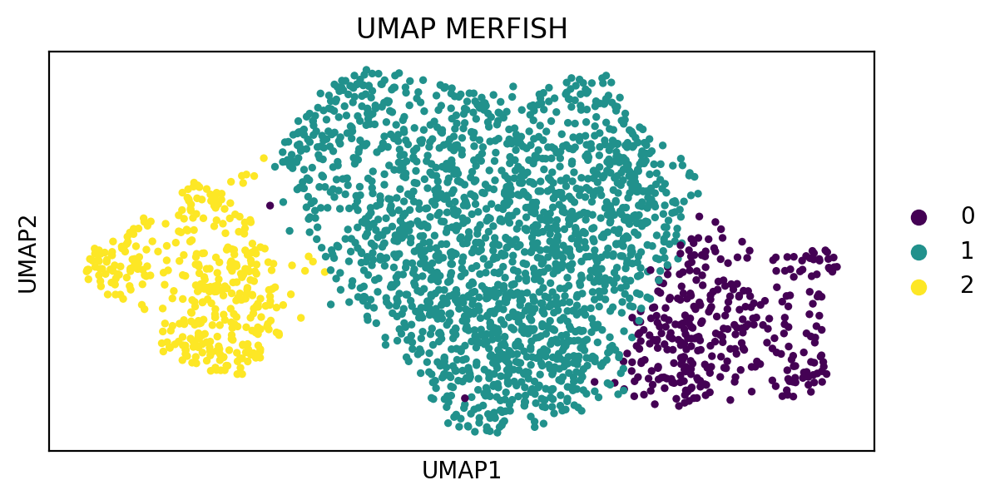

In [11]:
a = sc.pl.umap(adata_mer, color=['coarse_clusters_ordered'], show = False, palette = 'viridis')
a.set_aspect('equal')
a.set_title('UMAP MERFISH')
# a.invert_yaxis()
plt.gcf().set_dpi(200) 

## impute retroseq DE genes

In [102]:
retro_DE_genes = np.array([['Btk', 'Ttr', 'Grik1'],
       ['Gchfr', 'Kcne2', 'Dab1'],
       ['Erg', 'Ghrl', 'Lhfpl3'],
       ['Tcl1b2', 'Lmcd1', 'Klhl4'],
       ['Trpv3', 'Paqr6', 'Sncg'],
       ['Ikbke', 'Tsks', 'Tacr3'],
       ['Adcy8', 'Cel', 'Thsd7b'],
       ['Cideb', 'Pear1', 'Luzp2'],
       ['Otog', 'Echdc2', 'Crb1'],
       ['Kif2c', 'Gad1', 'Tshr'],
       ['Iyd', 'Sla2', 'Rbfox3'],
       ['Lypd6', 'Gstm3', 'Il5ra'],
       ['Eng', 'Tagln2', 'Nox4'],
       ['Aim2', 'Cd38', 'Stxbp5l'],
       ['Igf2bp1', 'Cntd1', 'Pmp22'],
       ['2610318N02Rik', 'Atxn7', 'Cntn3'],
       ['Slc38a4', 'Ccdc155', 'Glra3'],
       ['Dapk2', 'Slc25a48', 'Col24a1'],
       ['Tcf7', 'Slc22a20', 'Nfia'],
       ['Ifi30', 'Mmp21', 'Plxdc2']], dtype='<U13')



retro_DE_genes = np.array([['Itgae', 'Ddx43', 'Tacr3'],
       ['Col6a6', 'Vsx2', 'Ccdc122'],
       ['Slpi', 'Tbx4', 'Stxbp5l'],
       ['Glp1r', 'Fbxo32', 'Pcdh7'],
       ['Ttr', 'Tnfrsf11a', 'Ret'],
       ['Slc25a48', 'Mlxipl', 'Tshr'],
       ['Zar1l', 'Ak8', 'Dab1'],
       ['Cass4', 'Pcdhb11', 'Parm1'],
       ['Fmo3', 'Lypd6', 'Lhfpl3'],
       ['Slc5a11', 'Ikzf3', 'Col24a1']], dtype='<U13')



In [103]:

retro_DE_genes_fl_all = retro_DE_genes.flatten()
retro_DE_genes_plot_all = retro_DE_genes_fl_all[np.where([g in adata_sc.var_names for g in retro_DE_genes_fl_all])[0]]

retro_DE_genes_plot_per_group = []
for k in range(3):
    retro_DE_genes_fl = retro_DE_genes[:,k]
    retro_DE_genes_plot = retro_DE_genes_fl[np.where([g in adata_sc.var_names for g in retro_DE_genes_fl])[0]]
    retro_DE_genes_plot_per_group.append(retro_DE_genes_plot)

In [104]:
adata_mer = replace_imputedvalues(adata_mer,adata_mer_imputed, retro_DE_genes_plot_all)

In [105]:
projectionsite_list = ['frontal cortex','cerebellum','spinal cord']

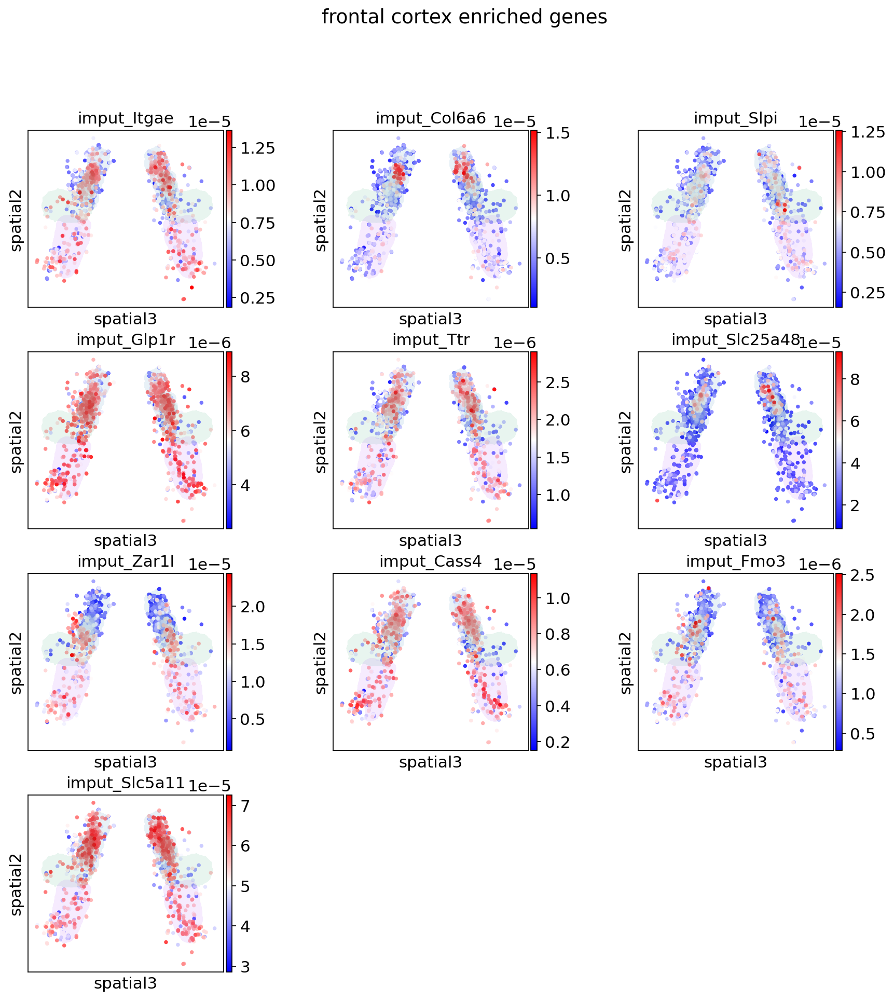

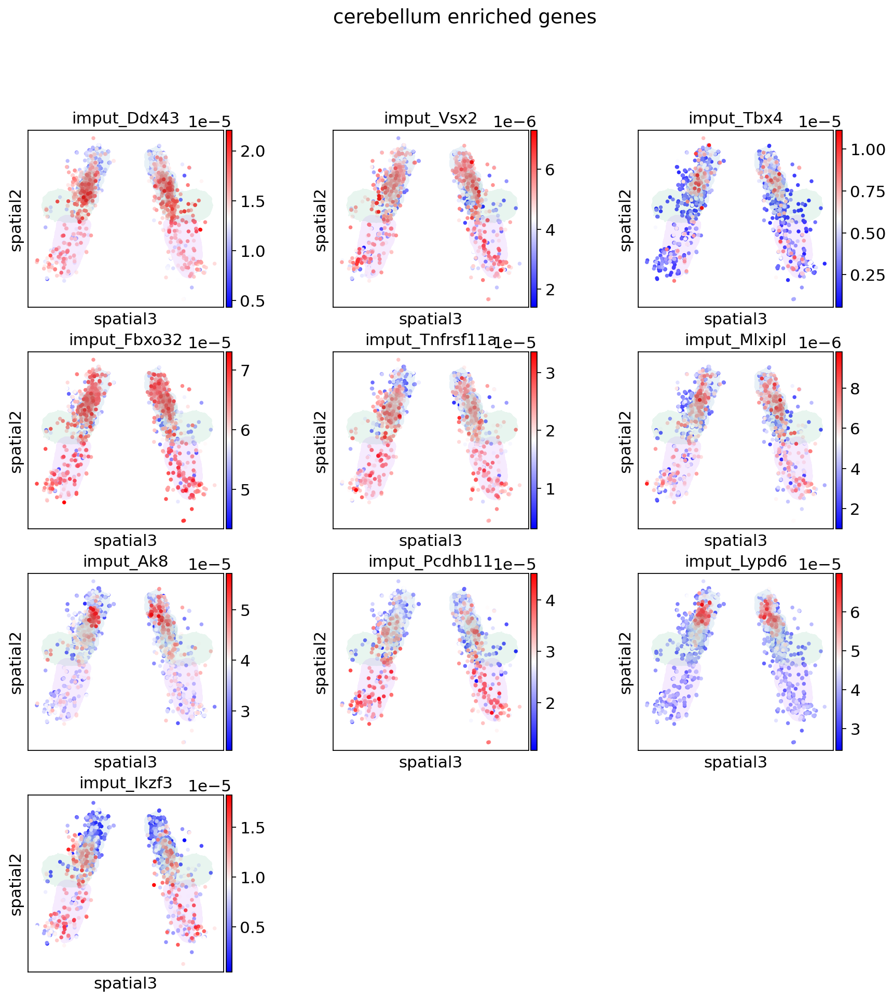

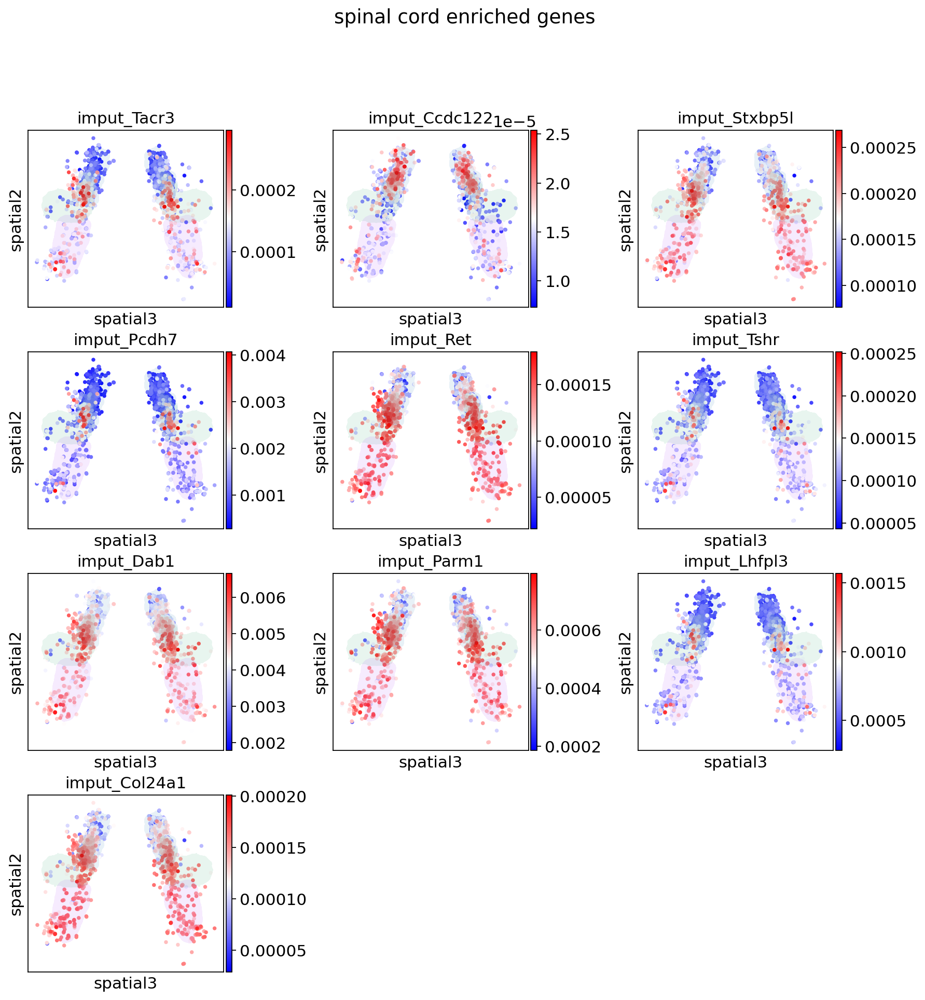

In [106]:
for m,geneset in enumerate(retro_DE_genes_plot_per_group):
    if len(geneset)>1:
        with plt.rc_context({"figure.figsize": (3.5,3)}):
            ax= sc.pl.embedding(adata_mer,basis='spatial',dimensions=(2,1),
                   color = [f'imput_{g}' for g in geneset],           
                   cmap='bwr',ncols=3, 
#                                 size = 5, 
                                show = False)
            for a in ax:
                a.triplot(mesh_LC.vertices.T[2], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .1, label = 'LC')
                a.triplot(mesh_CD.vertices.T[2], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .1, label = 'CD')
                a.triplot(mesh_CV.vertices.T[2], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .1, label = 'CV')
                a.invert_yaxis()
                a.set_aspect('equal')
#             fig = ax[0].figure  # assuming ax is a list of axes from your sc.pl.embedding call
            plt.suptitle(projectionsite_list[m]+' enriched genes', y=1)
            plt.show()    


In [110]:
genes_i_like =retro_DE_genes[0]

/scratch/fast/206493/ipykernel_3087853/2624114013.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  c=color_values[neworder], cmap='bwr', s=20)
/scratch/fast/206493/ipykernel_3087853/2624114013.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  c=color_values[neworder], cmap='bwr', s=20)
/scratch/fast/206493/ipykernel_3087853/2624114013.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  c=color_values[neworder], cmap='bwr', s

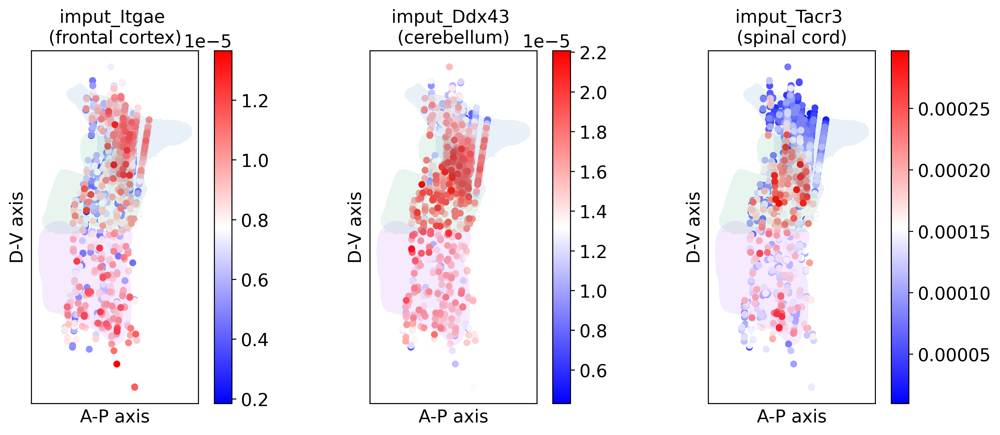

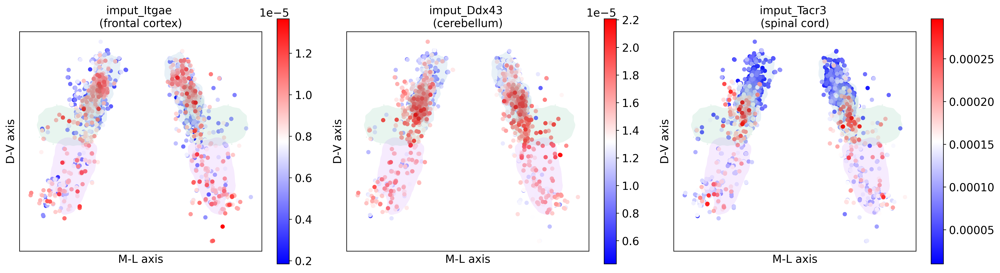

In [116]:
coords = adata_mer.obsm['spatial']  # Expected shape: (n_cells, 2)
x_coords = coords[:, 0]
y_coords = coords[:, 1]
z_coords = coords[:, 2]

fig, axes = plt.subplots(1,3, squeeze=False, figsize = (12,5))
axes = axes.flatten()
for i, gene in enumerate(genes_i_like):
    ax = axes[i]    
    color_values = adata_mer.obs[f'imput_{gene}']
    neworder = np.argsort(color_values)
    sca = ax.scatter(x_coords[neworder], y_coords[neworder], 
                     c=color_values[neworder], cmap='bwr', s=20)        
    fig.colorbar(sca, ax=ax, orientation='vertical')
    ax.triplot(mesh_LC.vertices.T[0], mesh_LC.vertices.T[1],
               mesh_LC.faces, alpha=0.1, label='LC')
    ax.triplot(mesh_CD.vertices.T[0], mesh_CD.vertices.T[1],
               mesh_CD.faces, alpha=0.1, label='CD')
    ax.triplot(mesh_CV.vertices.T[0], mesh_CV.vertices.T[1],
               mesh_CV.faces, alpha=0.1, label='CV')
    ax.invert_yaxis()
    ax.set_aspect('equal')
    ax.set_ylabel("D-V axis");ax.set_xlabel("A-P axis")
    ax.set_xticks([]);ax.set_yticks([]);
    ax.set_title(f'imput_{gene} \n({projectionsite_list[i]})')
    ax.grid(False)
fig.tight_layout()    
plt.gcf().set_dpi(200) 
    
fig, axes = plt.subplots(1,3, squeeze=False, figsize = (18,5))
axes = axes.flatten()
for i, gene in enumerate(genes_i_like):
    ax = axes[i]
    color_values = adata_mer.obs[f'imput_{gene}']
    neworder = np.argsort(color_values)
    sca = ax.scatter(z_coords[neworder], y_coords[neworder], 
                     c=color_values[neworder], cmap='bwr', s=20)        
    cbar = fig.colorbar(sca, ax=ax, orientation='vertical')
    ax.triplot(mesh_LC.vertices.T[2], mesh_LC.vertices.T[1],
               mesh_LC.faces, alpha=0.1, label='LC')
    ax.triplot(mesh_CD.vertices.T[2], mesh_CD.vertices.T[1],
               mesh_CD.faces, alpha=0.1, label='CD')
    ax.triplot(mesh_CV.vertices.T[2], mesh_CV.vertices.T[1],
               mesh_CV.faces, alpha=0.1, label='CV')
    ax.invert_yaxis()
    ax.set_aspect('equal')
    ax.set_ylabel("D-V axis");ax.set_xlabel("M-L axis")
    ax.set_xticks([]);ax.set_yticks([]);
    ax.set_title(f'imput_{gene} \n({projectionsite_list[i]})')
    ax.grid(False)
fig.tight_layout() 
plt.gcf().set_dpi(200) 
    

In [114]:
adata_mer.obsm

AxisArrays with keys: X_scVI, X_umap, spatial, X_pca

/scratch/fast/206493/ipykernel_3087853/2710498013.py:9: UserWarning: Adding colorbar to a different Figure <Figure size 800x560 with 2 Axes> than <Figure size 1440x400 with 6 Axes> which fig.colorbar is called on.
  fig.colorbar(sca, orientation='vertical')


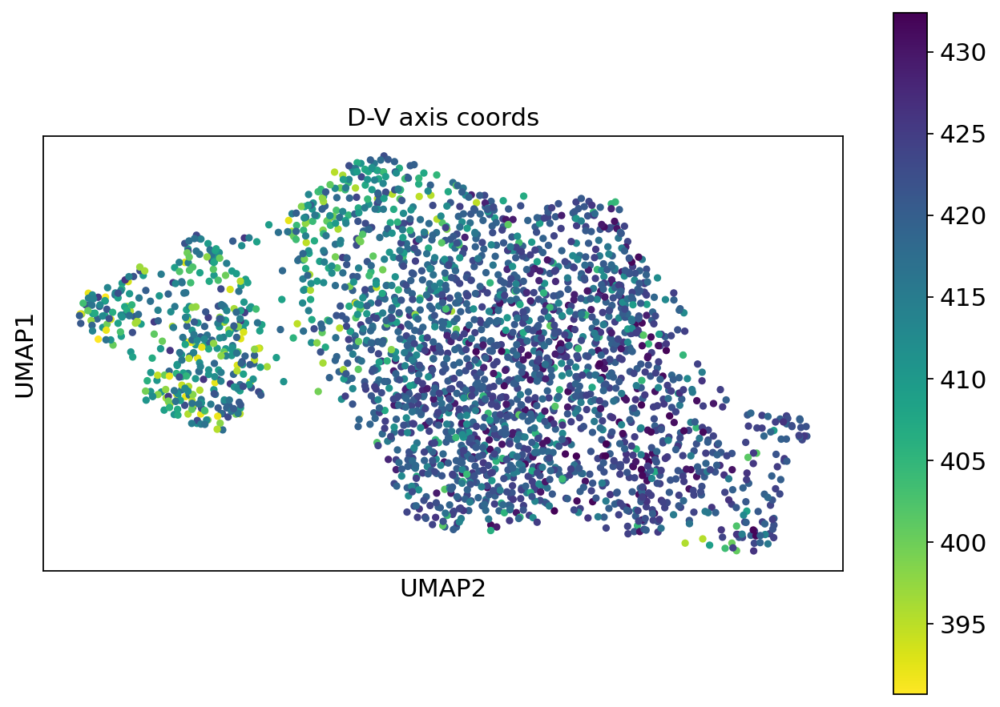

In [115]:

umapcoords = adata_mer.obsm['X_umap']  # Expected shape: (n_cells, 2)
x_coords = umapcoords[:, 0]
y_coords = umapcoords[:, 1]
plt.figure(figsize = (10,7))
sca = plt.scatter(x_coords, y_coords, c=adata_mer.obsm['spatial'][:,0], 
                  cmap='viridis_r', s=10)        
plt.gca().set_aspect('equal')
plt.title('D-V axis coords')
fig.colorbar(sca, orientation='vertical')
plt.ylabel('UMAP1');plt.yticks([])
plt.xlabel('UMAP2');plt.xticks([])
plt.grid(False)

# CCA
### preprocess

In [8]:
adata_mer.X.max()

np.float32(0.24816138)

In [9]:
import matplotlib.font_manager as fm
import seaborn as sns

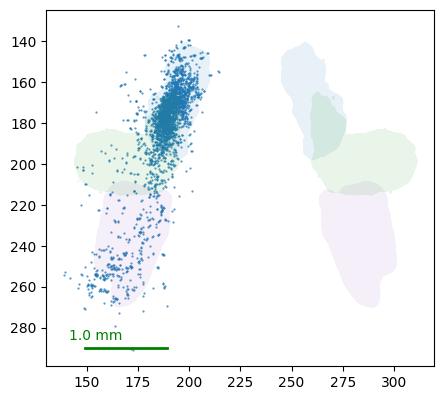

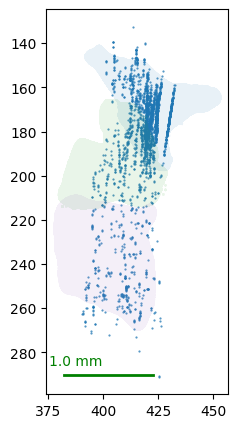

In [10]:

scaler_X = StandardScaler().fit(adata_mer.X)
X_mer_scaled = scaler_X.transform(adata_mer.X)

S_mer = get_hemi(adata_mer.obsm['spatial'], mesh_LC)    
scaler_S = StandardScaler().fit(S_mer)
# S_mer_scaled = scaler_S.transform(S_mer)
S_mer_scaled = S_mer.copy()

fig, ax = plt.subplots(figsize = (5,5))
ax.scatter(S_mer[:,2], S_mer[:,1],s=.3, alpha =.8);
plotting.plot_mesh(ax, allmeshes, direction = 'c')
xlim = plt.xlim()
ylim = plt.ylim()
x0 = xlim[0] + 0.1 * (xlim[1] - xlim[0])
y0 = ylim[0] + 0.05 * (ylim[1] - ylim[0])
plt.plot([x0, x0 + 40], [y0, y0], color='green', linewidth=2)
plt.text(x0 + 5, y0-3, f'{40*25*0.001} mm', ha='center', va='bottom', color = 'green')
plt.show()


fig, ax = plt.subplots(figsize = (5,5))
ax.scatter(S_mer[:,0], S_mer[:,1],s=.3, alpha =.8);
plotting.plot_mesh(ax, allmeshes, direction = 's')
xlim = plt.xlim()
ylim = plt.ylim()
x0 = xlim[0] + 0.1 * (xlim[1] - xlim[0])
y0 = ylim[0] + 0.05 * (ylim[1] - ylim[0])
plt.plot([x0, x0 + 40], [y0, y0], color='green', linewidth=2)
plt.text(x0 + 5, y0-3, f'{40*25*0.001} mm', ha='center', va='bottom', color = 'green')
plt.show()


In [11]:
220*25/1000

5.5

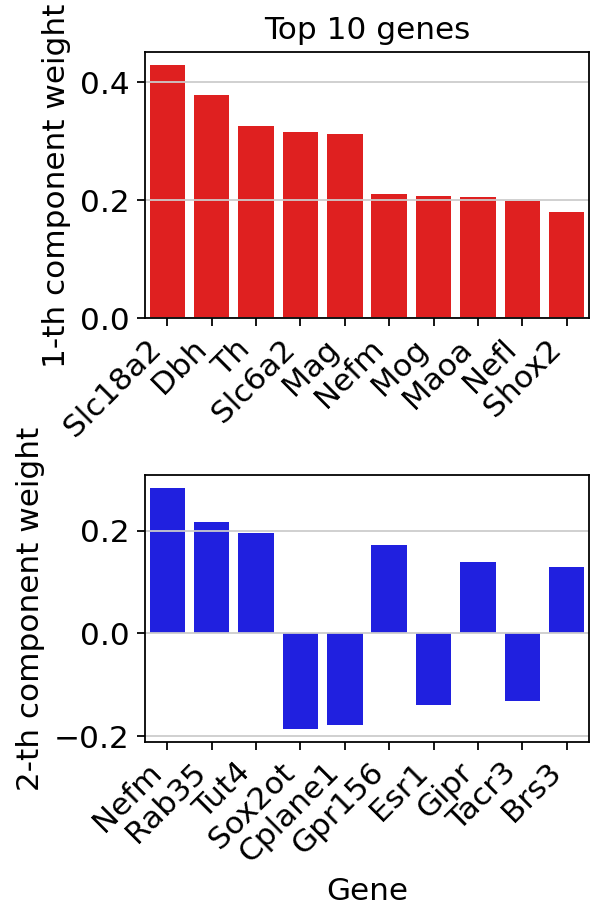

In [70]:

gene_labels = [f"Gene {i}" for i in range(adata_mer.X.shape[1])]
gene_labels = list(adata_mer.var_names)

T = 10
k=0
loadings_1_df = pd.DataFrame({'gene': gene_labels,'loading': cca.x_weights_[:, k]})
loadings_1_df['abs_loading'] = loadings_1_df['loading'].abs()
loadings_1_sorted = loadings_1_df.sort_values('abs_loading', ascending=False)

plt.figure(figsize=(4,6))
plt.subplot(2,1,1)
sns.barplot(x='gene', y='loading', data=loadings_1_sorted.head(T), color = 'r')
plt.xticks(rotation=45, ha='right')
plt.xlabel("")
plt.ylabel(f"{k+1}-th component weight")
plt.title(f"Top {T} genes")
# plt.tight_layout()
# plt.show()


k=1
loadings_2_df = pd.DataFrame({'gene': gene_labels,'loading': cca.x_weights_[:, k]})
loadings_2_df['abs_loading'] = loadings_2_df['loading'].abs()
loadings_2_sorted = loadings_2_df.sort_values('abs_loading', ascending=False)

plt.subplot(2,1,2)
sns.barplot(x='gene', y='loading', data=loadings_2_sorted.head(T), color = 'b') 
plt.xticks(rotation=45, ha='right')
plt.xlabel("Gene")
plt.ylabel(f"{k+1}-th component weight")
# plt.title(f"Top {T} genes")
plt.tight_layout()
plt.show()

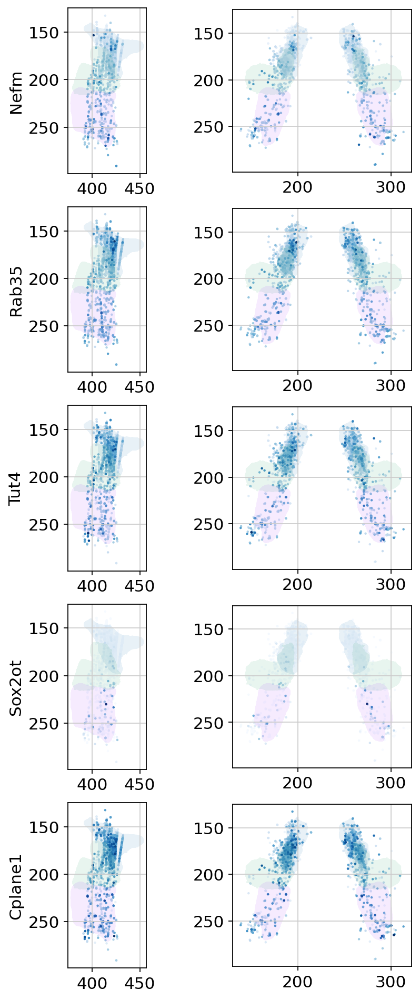

In [71]:
T = 5
fig, axes = plt.subplots(T,2,figsize=(6,3*T))

for i in range(T):
    top_gene = loadings_2_sorted.iloc[i]['gene']
    gene_index = list(adata_mer.var_names).index(top_gene)
    gene_expression = adata_mer.X[:, gene_index].toarray().flatten() if hasattr(adata_mer.X, "toarray") else adata_mer.X[:, gene_index]
    ordered = np.argsort(gene_expression)

    ax = axes[i,0]
    sca = ax.scatter(adata_mer.obsm['spatial'][ordered, 0], adata_mer.obsm['spatial'][ordered, 1], c=gene_expression[ordered], cmap='Blues',s=1)
    ax.set_title('')
    ax.set_aspect('equal')
    ax.triplot(mesh_LC.vertices.T[0], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .1, label = 'LC')
    ax.triplot(mesh_CD.vertices.T[0], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .1, label = 'CD')
    ax.triplot(mesh_CV.vertices.T[0], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .1, label = 'CV')
    ax.invert_yaxis()
    ax.set_ylabel(top_gene)

    ax = axes[i,1]
    sca = ax.scatter(adata_mer.obsm['spatial'][ordered, 2], adata_mer.obsm['spatial'][ordered, 1], c=gene_expression[ordered], cmap='Blues',s=1)
    ax.set_title('')
    ax.set_aspect('equal')
    ax.triplot(mesh_LC.vertices.T[2], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .1, label = 'LC')
    ax.triplot(mesh_CD.vertices.T[2], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .1, label = 'CD')
    ax.triplot(mesh_CV.vertices.T[2], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .1, label = 'CV')
    ax.invert_yaxis()

# gradient genes in this vector directions 

In [72]:
from scipy.stats import spearmanr, pearsonr

In [73]:
cca.y_weights_[:,1]

array([-0.05273333, -0.99514184, -0.08313792])

In [74]:
k=0
direction_of_interest = -(cca.y_weights_[:,k]) 
S_mer = get_hemi(adata_mer.obsm['spatial'], mesh_LC)    
direction_norm = direction_of_interest / np.linalg.norm(direction_of_interest)
projected = S_mer @ direction_norm
if hasattr(adata_mer.X, 'toarray'):
    X = adata_mer.X.toarray()
else:
    X = np.array(adata_mer.X)
gene_names = adata_mer.var_names
results = []
for i, gene in enumerate(gene_names):
    expr = X[:, i]
    corr, pval = spearmanr(expr, projected)
    results.append((gene, corr, pval))

df_results = pd.DataFrame(results, columns=['gene', 'spearman_corr', 'p_value'])
df_results_sorted = df_results.sort_values(by='spearman_corr', key=lambda s: s.abs(), ascending=False)

newly_found = list(df_results_sorted['gene'])
print(df_results_sorted.head(20))


        gene  spearman_corr        p_value
275  Tmem178      -0.560490  3.370862e-219
44     Chodl       0.555538  1.406283e-214
237    Shox2      -0.544322  2.139085e-204
197     Pdyn       0.529259  2.579116e-191
269    Tacr3      -0.527870  3.843586e-190
304    Grik1      -0.527515  7.642224e-190
163     Nefm      -0.527219  1.356739e-189
70     Crim1      -0.520089  1.140192e-183
101    Galr1      -0.516959  4.103553e-181
194   Pde11a       0.505415  6.515562e-172
191     Pax5       0.485459  8.112652e-157
160   Necab2      -0.475388  1.427875e-149
292     Vwc2      -0.469488  1.941396e-145
251   Slc6a2       0.465076  2.121210e-142
161     Nefh      -0.464007  1.138269e-141
97    Gabrg1      -0.442432  1.725639e-127
91     Fbxl7       0.439202  1.876188e-125
198    Pdzd2      -0.430120  7.623704e-120
212   Prss23      -0.426476  1.215111e-117
86      Esr1      -0.424325  2.354417e-116


/scratch/fast/206493/ipykernel_3087853/1458256108.py:14: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


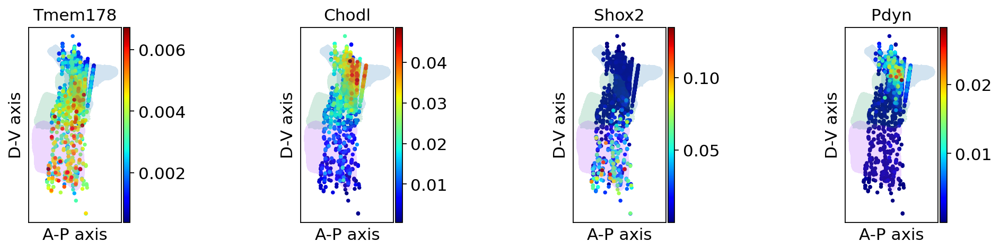

In [75]:
T = 4
with plt.rc_context({"figure.figsize": (3,3)}):    
    ax = sc.pl.embedding(adata_mer, dimensions = (0, 1),basis="spatial", cmap ='jet',
                         color=newly_found[:T], ncols =T, show=False)    
    for a in ax:
        a.triplot(mesh_LC.vertices.T[0], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .2, label = 'LC')
        a.triplot(mesh_CD.vertices.T[0], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .2, label = 'CD')
        a.triplot(mesh_CV.vertices.T[0], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .2, label = 'CV')
        a.invert_yaxis()
        a.set_aspect('equal')
        a.set_ylabel('D-V axis')
        a.set_xlabel('A-P axis')
        
    plt.tight_layout()

In [76]:
k=1
direction_of_interest = -(cca.y_weights_[:,k]) 
S_mer = get_hemi(adata_mer.obsm['spatial'], mesh_LC)    
direction_norm = direction_of_interest / np.linalg.norm(direction_of_interest)
projected = S_mer @ direction_norm
if hasattr(adata_mer.X, 'toarray'):
    X = adata_mer.X.toarray()
else:
    X = np.array(adata_mer.X)
gene_names = adata_mer.var_names
results = []
for i, gene in enumerate(gene_names):
    expr = X[:, i]
    corr, pval = spearmanr(expr, projected)
    results.append((gene, corr, pval))

df_results = pd.DataFrame(results, columns=['gene', 'spearman_corr', 'p_value'])
df_results_sorted = df_results.sort_values(by='spearman_corr', key=lambda s: s.abs(), ascending=False)

newly_found = list(df_results_sorted['gene'])
print(df_results_sorted.head(20))


        gene  spearman_corr        p_value
269    Tacr3       0.706325   0.000000e+00
197     Pdyn      -0.673065   0.000000e+00
275  Tmem178       0.640425  5.459796e-306
194   Pde11a      -0.617000  6.064231e-278
44     Chodl      -0.596971  8.883209e-256
86      Esr1       0.582197  2.102524e-240
163     Nefm       0.552459  9.601464e-212
160   Necab2       0.533483  6.450786e-195
198    Pdzd2       0.524312  3.674497e-187
101    Galr1       0.502687  8.651389e-170
237    Shox2       0.482726  7.930779e-155
296  Zfp804b       0.474656  4.697017e-149
203     Pon2      -0.462281  1.693154e-140
31     Calcr      -0.455209  9.174130e-136
161     Nefh       0.453187  1.974897e-134
75       Dbh      -0.438677  3.999874e-125
136   Kcnip4      -0.434334  1.999920e-122
97    Gabrg1       0.426520  1.143299e-117
204     Pon3      -0.423951  3.934357e-116
70     Crim1       0.422610  2.465467e-115


/scratch/fast/206493/ipykernel_3087853/320485610.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


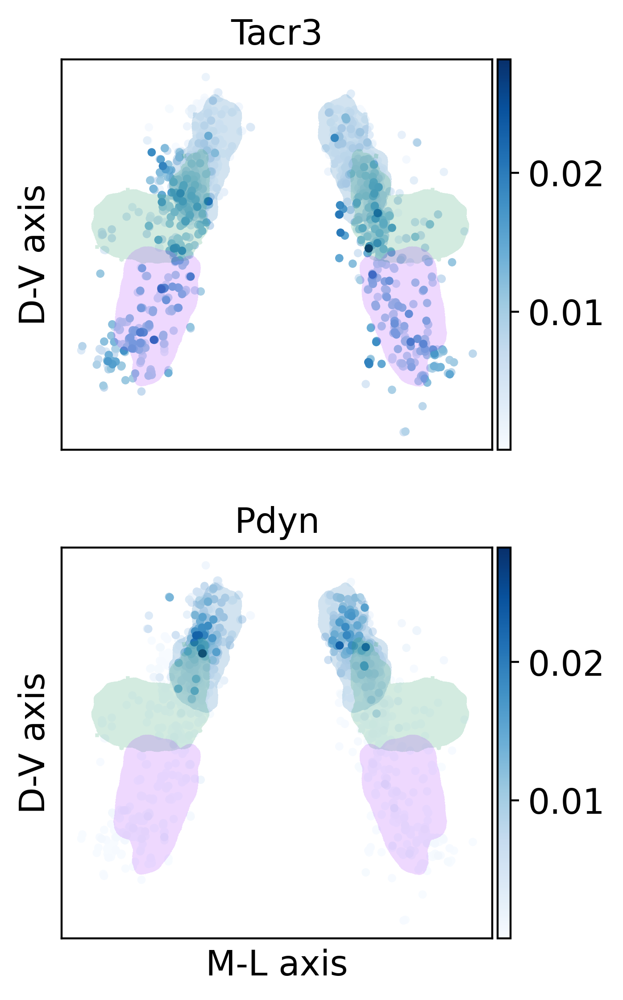

In [119]:
T = 2
with plt.rc_context({"figure.figsize": (3,3)}):    
    ax = sc.pl.embedding(adata_mer, dimensions = (2, 1),basis="spatial", cmap ='Blues',
                         color=newly_found[:T], ncols =1, show=False)    
    for a in ax:
        a.triplot(mesh_LC.vertices.T[2], mesh_LC.vertices.T[1], mesh_LC.faces, alpha = .2, label = 'LC')
        a.triplot(mesh_CD.vertices.T[2], mesh_CD.vertices.T[1], mesh_CD.faces, alpha = .2, label = 'CD')
        a.triplot(mesh_CV.vertices.T[2], mesh_CV.vertices.T[1], mesh_CV.faces, alpha = .2, label = 'CV')
        a.invert_yaxis()
        a.set_aspect('equal')
        a.set_ylabel('D-V axis')
        a.set_xlabel('M-L axis') if a == ax[-1] else a.set_xlabel('')
            
        
plt.tight_layout()
plt.gcf().set_dpi(200) 


### heatmap for the imputed genes 
- now the order of the cells are still gonna follow that projection 

In [115]:
pca_arc_genes =['Epha6',
 'Htr2c',
 'Lrrc7',
 'Robo1',
 'Pantr1',
 'Alcam',
 'Lnx1',
 'Ncam2',
 'Inpp4b',
 'Cntnap5b',
 'Dab1',
 'Gpc6',
 'Fat3',
 'Chsy3',
 'B3galt1',
 'Hs6st3',
 'Parm1',
 'Tbc1d4',
 'Thsd7b',
 'Glra2',]



In [116]:

pca_arc_genes =['Epha6',
 'Htr2c',
 'Lrrc7',
 'Robo1',
 'Pantr1',
 'Alcam',
 'Lnx1',
 'Ncam2',
 'Inpp4b',
 'Cntnap5b',
 'Cdh20',
 'Cntnap5a',
 'Cdh18',
 'Gm20646',
 'Col18a1',
 'Setbp1',
 'Alk',
 'Lrrtm4',
 'Dip2c',
 'Slit1',
 'Dab1',
 'Gpc6',
 'Fat3',
 'Chsy3',
 'B3galt1',
 'Hs6st3',
 'Parm1',
 'Tbc1d4',
 'Thsd7b',
 'Glra2',
 'Arhgap15',
 'Dach1',
 'Kcnab1',
 'Neto1',
 'Plxna4',
 'Clstn2',
 'Efna5',
 'Kalrn',
 'Slit2',
 'Gabra2']


In [117]:
impu_hm = adata_mer.obs[[f'imput_{g}' for g in pca_arc_genes]].values[t_order]
minval = np.min(impu_hm,0)
impu_hm -= minval
impu_hm /= np.max(impu_hm, 0)
impu_hm = impu_hm.T

In [119]:
quantile_range = np.array((0.01, 0.9))
binnum = 11
new_positions = np.linspace(np.quantile(projected, quantile_range[0]), np.quantile(projected, quantile_range[1]), 
                            binnum)

impu_hm_smth = np.zeros((impu_hm.shape[0], binnum))

bin_width = new_positions[1] - new_positions[0]
half_width = bin_width / 2

for i, pos in enumerate(new_positions):
    left_idx = np.searchsorted(t_sorted, pos - half_width, side='left')
    right_idx = np.searchsorted(t_sorted, pos + half_width, side='right')    
    if right_idx > left_idx:
        impu_hm_smth[:, i] = np.mean(impu_hm[:, left_idx:right_idx], axis=1)
    else:
        print('foooo')
        nearest_idx = np.searchsorted(t_sorted, pos, side='left')
        if nearest_idx == len(t_sorted):
            nearest_idx = len(t_sorted) - 1
        impu_hm_smth[:, i] = impu_hm[:, nearest_idx]

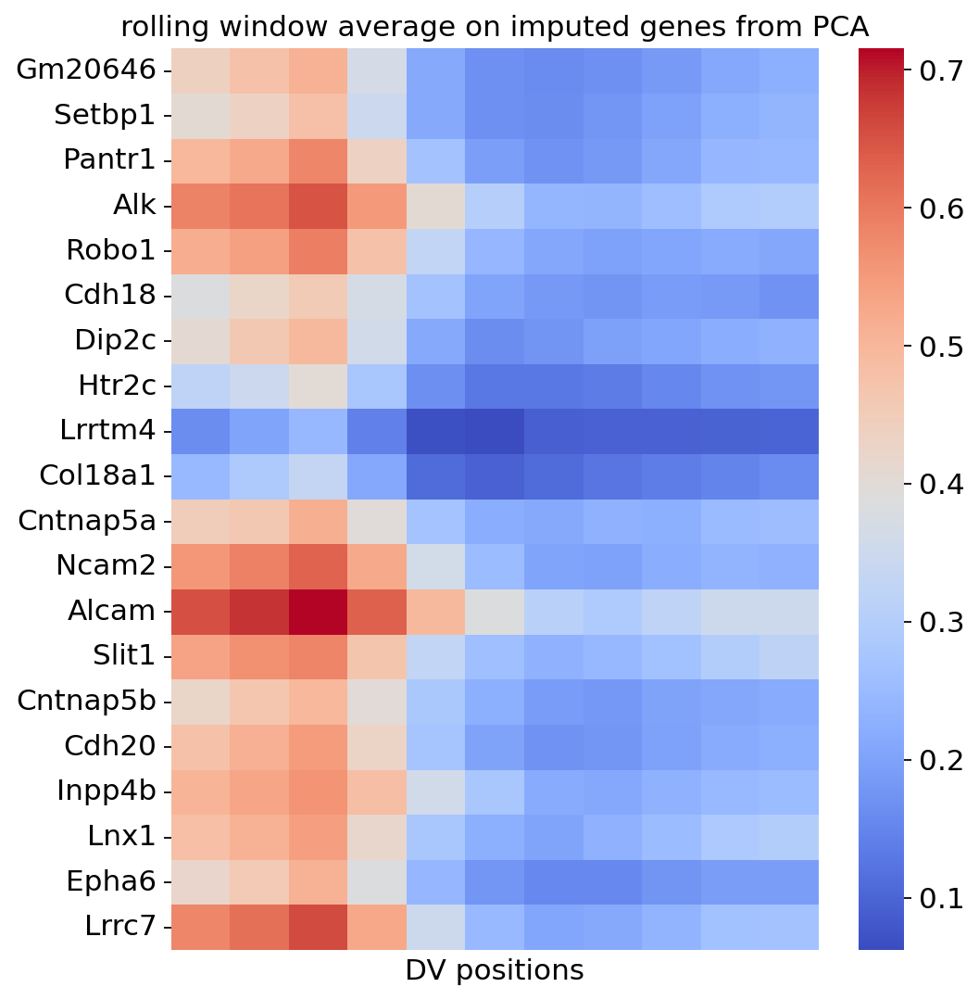

In [121]:

plt.figure(figsize=(7,8))
sns.heatmap(impu_hm_smth[row_order], cmap='coolwarm')
plt.yticks(np.arange(len(row_order)) + 0.5, [pca_arc_genes[l] for l in row_order], rotation=0)
plt.xlabel('DV positions')
plt.xticks([]);
plt.grid(False)
plt.title("rolling window average on imputed genes from PCA");
# ax = plt.gca()


dv_coord_D = np.outer(np.quantile(projected, quantile_range[0]), direction_norm)[0,1]
dv_coord_D = dv_coord_D*25/1000
dv_coord_V = np.outer(np.quantile(projected, quantile_range[1]), direction_norm)[0,1]
dv_coord_V = dv_coord_V*25/1000
ax.text(0, -0.05, f'<- Dorsal\n{np.around(dv_coord_D,3)} mm', transform=ax.transAxes,
        ha='left', va='center', fontsize=12)
ax.text(1, -0.05, f'Ventral ->\n{np.around(dv_coord_V,3)} mm', transform=ax.transAxes,
        ha='right', va='center', fontsize=12)
plt.show()


Text(0.5, 1.0, 'thresholded at 0.7 quantile')

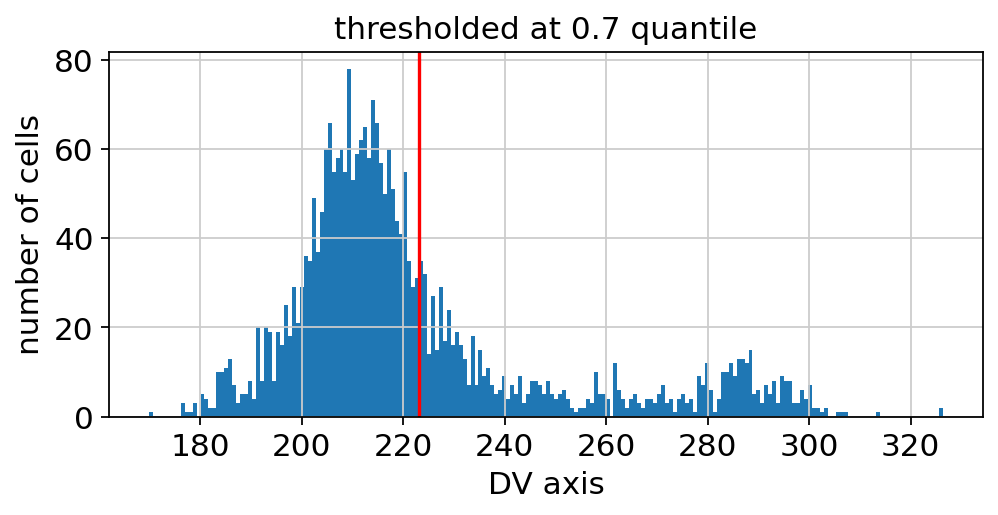

In [123]:
plt.figure(figsize = (7,3))
plt.hist(projected, bins = 200);
plt.axvline(np.quantile(projected, 0.7), color='red')
plt.xlabel('DV axis')
plt.ylabel('number of cells')
plt.title('thresholded at 0.7 quantile')

# order based on the PCA ones

In [124]:
row_order = [5,
 16,
 2,
 3,
 18,
 11,
 0,
 4,
 7,
 10,
 19,
 8,
 6,
 15,
 1,
 13,
 12,
 9,
 14,
 17,
 37,
 31,
 30,
 34,
 23,
 26,
 35,
 28,
 22,
 20,
 38,
 27,
 32,
 36,
 29,
 33,
 39,
 25,
 21,
 24]


In [125]:
projected.shape, impu_hm.shape

((2651,), (40, 2651))

In [133]:
quantile_range = np.array((0.01, 0.7))
binnum = 11
new_positions = np.linspace(np.quantile(projected, quantile_range[0]), 
                            np.quantile(projected, quantile_range[1]), binnum)

impu_hm_smth = np.zeros((impu_hm.shape[0], binnum))

bin_width = new_positions[1] - new_positions[0]
half_width = bin_width *0.6

for i, pos in enumerate(new_positions):
    left_idx = np.searchsorted(t_sorted, pos - half_width, side='left')
    right_idx = np.searchsorted(t_sorted, pos + half_width, side='right')
    
    if right_idx > left_idx:
        impu_hm_smth[:, i] = np.mean(impu_hm[:, left_idx:right_idx], axis=1)
    else:
        print(i,'ffffooooo')
        nearest_idx = np.searchsorted(t_sorted, pos, side='left')
        if nearest_idx == len(t_sorted):
            nearest_idx = len(t_sorted) - 1
        impu_hm_smth[:, i] = impu_hm[:, nearest_idx]

plt.figure(figsize=(7,8))
sns.heatmap( impu_hm_smth[row_order], cmap='coolwarm')
plt.yticks(np.arange(len(row_order)) + 0.5, [pca_arc_genes[l] for l in row_order], rotation=0)
for i, tick in enumerate(plt.gca().get_yticklabels()):
    tick.set_color('blue' if i < len(pca_arc_genes)/2 else 'red')

plt.xlabel('DV positions')
plt.xticks([]);
plt.grid(False)
plt.title("imputed genes from PCA");
ax = plt.gca()


dv_coord_D = np.outer(np.quantile(projected, quantile_range[0]), direction_norm)[0,1]
dv_coord_D = dv_coord_D*25/1000
dv_coord_V = np.outer(np.quantile(projected, quantile_range[1]), direction_norm)[0,1]
dv_coord_V = dv_coord_V*25/1000
ax.text(0, -0.05, f'<- Dorsal\n{np.around(dv_coord_D,3)} mm', transform=ax.transAxes,
        ha='left', va='center', fontsize=12)
ax.text(1, -0.05, f'Ventral ->\n{np.around(dv_coord_V,3)} mm', transform=ax.transAxes,
        ha='right', va='center', fontsize=12)

# plt.show()


plt.tight_layout()

png_path = '/home/shuonan.chen/scratch_shuonan/code/pons_merfish_pipeline/processing/result_pngs/high_rez_figs/PCA_imputed_heatmap'
plt.savefig(f'{png_path}.png', dpi=400, bbox_inches='tight')
plt.savefig(f'{png_path}.pdf', dpi=400, bbox_inches='tight')
plt.close()


In [135]:
quantile_range = np.array((0.01, 0.7))
binnum = 11
new_positions = np.linspace(np.quantile(projected, quantile_range[0]), 
                            np.quantile(projected, quantile_range[1]), binnum)

impu_hm_smth = np.zeros((impu_hm.shape[0], binnum))

bin_width = new_positions[1] - new_positions[0]
half_width = bin_width *0.6


for i, pos in enumerate(new_positions):
    left_idx = np.searchsorted(t_sorted, pos - half_width, side='left')
    right_idx = np.searchsorted(t_sorted, pos + half_width, side='right')
    
    if right_idx > left_idx:
        print(i,impu_hm[:, left_idx:right_idx].shape)
#         impu_hm_smth[:, i] = np.mean(impu_hm[:, left_idx:right_idx], axis=1)

0 (40, 45)
1 (40, 42)
2 (40, 76)
3 (40, 110)
4 (40, 171)
5 (40, 294)
6 (40, 375)
7 (40, 380)
8 (40, 366)
9 (40, 284)
10 (40, 175)
